# Higgs Analysis:

>This notebook contains work performed on coffea-casa cloud server. 
> Work in progress

In [1]:
from datetime import datetime
import pytz

ist = pytz.timezone('Asia/Kolkata')

print(f"Last modified: {datetime.now(ist).strftime('%d %B %Y, %H:%M')} IST")


Last modified: 13 January 2026, 01:48 IST


# Imports 

In [86]:
import os
import sys
import time
import gc
import psutil
import json
from pathlib import Path

# Data processing
import uproot
import awkward as ak
import numpy as np

# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches
import mplhep as hep

# Numerical computing
import vector
import hist
from hist import Hist
from tqdm import tqdm

# Parallel processing 
import dask
from dask import delayed, compute
from dask.distributed import Client, LocalCluster
import dask.bag as db
import dask_awkward as dak
import hist.dask as hda
from dask.diagnostics import ProgressBar
import coffea
from coffea_casa import CoffeaCasaCluster
from dask.distributed import progress

# others
!pip install prettytable
from prettytable import PrettyTable

vector.register_awkward()

print(" All imports loaded")

 All imports loaded


# All Directories and path

In [3]:

# BASE PATHS
HOME_DIR = Path(os.environ.get("HOME", "/home/cms-jovyan"))
PROJECT_NAME = "H-to-WW-NanoAOD-analysis"

 
# DERIVED PATHS
PROJECT_DIR = HOME_DIR / PROJECT_NAME
DATASETS_DIR = PROJECT_DIR / "Datasets"
DATA_DIR = DATASETS_DIR / "DATA"
MC_DIR = DATASETS_DIR / "MC_samples"
AUX_DIR = PROJECT_DIR / "Auxillary_files"
OUTPUT_DIR = PROJECT_DIR / "Plots" / "stacked"

 
# JSON FILES
GOLDEN_JSON_PATH = AUX_DIR / "Cert_271036-284044_13TeV_Legacy2016_Collisions16_JSON.txt"

 
# RUN PERIODS
RUN_PERIODS_2016 = {
    'Run2016G': {'run_min': 278820, 'run_max': 280385},
    'Run2016H': {'run_min': 280919, 'run_max': 284044}
}

 
# PRINT CONFIGURATION
 
print(f"HOME_DIR:         {HOME_DIR}")
print(f"PROJECT_DIR:     {PROJECT_DIR}")
print(f"DATA_DIR:        {DATA_DIR}")
print(f"MC_DIR:          {MC_DIR}")
print(f"AUX_DIR:         {AUX_DIR}")
print(f"OUTPUT_DIR:      {OUTPUT_DIR}")
print(f"GOLDEN_JSON:      {GOLDEN_JSON_PATH}")
print(f"JSON exists:     {GOLDEN_JSON_PATH.exists()}")

HOME_DIR:         /home/cms-jovyan
PROJECT_DIR:     /home/cms-jovyan/H-to-WW-NanoAOD-analysis
DATA_DIR:        /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Datasets/DATA
MC_DIR:          /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Datasets/MC_samples
AUX_DIR:         /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Auxillary_files
OUTPUT_DIR:      /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked
GOLDEN_JSON:      /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Auxillary_files/Cert_271036-284044_13TeV_Legacy2016_Collisions16_JSON.txt
JSON exists:     True


In [55]:

# Sample mapping 
SAMPLE_MAPPING = {
    'data': 'Data',
    'higgs':  'ggH_HWW',
    'dytoll': 'DY_to_Tau_Tau',
    'top': 'Top_antitop',
    'fakes': 'Fakes',
    'vz': 'Diboson',
    'ggww':  'ggWW',
    'ww': 'WW',
    'vg': 'VG'
}

def load_urls_from_file(filepath, max_files=None):
    """Load XRootD URLs from text file"""
    urls = []
    if not os.path.exists(filepath):
        return urls
    
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if line and line.startswith('root://'):
                urls.append(line)
                if max_files and len(urls) >= max_files:
                    break
    return urls



def load_all_files(data_dir, mc_dir, max_per_sample=None):
    """Load all file URLs from directories"""
    
    files_dict = {}
    
    for directory in [data_dir, mc_dir]:
        if not os.path.exists(directory):
            continue
            
        for filename in os.listdir(directory):
            if not filename.endswith(('.txt')):
                continue
                
            filepath = os.path.join(directory, filename)
            filename_lower = filename.lower().replace('.txt', '')
            
            # Find label
            label = None
            for pattern, sample_label in SAMPLE_MAPPING.items():
                if pattern in filename_lower:
                    label = sample_label
                    break
            
            if not label:
                print(f"   Unknown file: {filename} - skipping")
                continue
            
            # Load URLs
            urls = load_urls_from_file(filepath, max_per_sample)
            
            if urls:
                if label in files_dict:
                    files_dict[label].extend(urls)
                else:
                    files_dict[label] = urls
    
    return files_dict


# files = load_all_files(DATA_DIR, MC_DIR, max_per_sample=1)  # TESTING
files = load_all_files(DATA_DIR, MC_DIR)  # FULL 

print("\n" + "="*70)
print("FILES TO PROCESS")
print("="*70)
total = 0
for label, urls in files.items():
    print(f"{label:20s}: {len(urls):4d} files")
    total += len(urls)
print("_"*70)
print(f"{'TOTAL':20s}: {total:4d} files")
print("="*70)



FILES TO PROCESS
Data                :   48 files
VG                  :   32 files
ggH_HWW             :   40 files
WW                  :    7 files
Fakes               :  206 files
Diboson             :   73 files
DY_to_Tau_Tau       :   61 files
ggWW                :  112 files
Top_antitop         :  197 files
______________________________________________________________________
TOTAL               :  776 files


In [56]:
SAMPLES = {
    "Fakes":          {"color": "#B3B3B3", "is_signal": False, "stack_order": 1},
    
    "VG":             {"color": "#FFCC00", "is_signal": False, "stack_order": 2},
    "Diboson":        {"color": "#A6CEE3", "is_signal": False, "stack_order": 3},
    
    "DY_to_Tau_Tau":  {"color": "#33A02C", "is_signal": False, "stack_order": 4},
    "Top_antitop":    {"color": "#FF7F00", "is_signal": False, "stack_order": 5},
    
    "ggWW":           {"color": "#6BAED6", "is_signal": False, "stack_order": 6},
    "WW":             {"color": "#1F78B4", "is_signal": False, "stack_order": 7},
    
    "ggH_HWW":        {"color": "#E41A1C", "is_signal": True,  "stack_order": 8},
    
    "Data":           {"color": "#000000", "is_signal": False, "stack_order": -1},
}

# Helper dictionaries
colour = {name: props["color"] for name, props in SAMPLES.items()}
stack_order = {name: props["stack_order"] for name, props in SAMPLES.items() if props["stack_order"] >= 0}

In [57]:
colour

{'Fakes': '#B3B3B3',
 'VG': '#FFCC00',
 'Diboson': '#A6CEE3',
 'DY_to_Tau_Tau': '#33A02C',
 'Top_antitop': '#FF7F00',
 'ggWW': '#6BAED6',
 'WW': '#1F78B4',
 'ggH_HWW': '#E41A1C',
 'Data': '#000000'}

In [58]:
stack_order

{'Fakes': 1,
 'VG': 2,
 'Diboson': 3,
 'DY_to_Tau_Tau': 4,
 'Top_antitop': 5,
 'ggWW': 6,
 'WW': 7,
 'ggH_HWW': 8}

# JSON validation functions

In [59]:
def load_golden_json(json_input, run_periods=None):
    """
    Load golden JSON from either a file path (str) or a dict.
    """
    
    if isinstance(json_input, str):
        with open(json_input, 'r') as f:
            golden_json = json.load(f)
    elif isinstance(json_input, dict):
        golden_json = json_input
    else:
        raise TypeError(f"Expected str or dict, got {type(json_input)}")
    
    valid_lumis = {}
    for run_str, lumi_ranges in golden_json.items():
        run = int(run_str)
        
        # Filter by run periods 
        if run_periods is not None: 
            in_period = any(
                period['run_min'] <= run <= period['run_max']
                for period in run_periods.values()
            )
            if not in_period:
                continue
        
        valid_lumis[run] = [tuple(lr) for lr in lumi_ranges]
    
    return valid_lumis


def apply_json_mask(arrays, json_input, run_periods=None):

    valid_lumis = load_golden_json(json_input, run_periods)
    
    runs = ak.to_numpy(arrays.run)
    lumis = ak.to_numpy(arrays.luminosityBlock)
    
    mask = np. zeros(len(runs), dtype=bool)
    
    for run, lumi_ranges in valid_lumis.items():
        run_mask = (runs == run)
        
        if not np.any(run_mask):
            continue
        
        # Check lumi sections 
        run_lumis = lumis[run_mask]
        run_lumi_mask = np.zeros(len(run_lumis), dtype=bool)
        
        for lumi_start, lumi_end in lumi_ranges: 
            run_lumi_mask |= (run_lumis >= lumi_start) & (run_lumis <= lumi_end)
        
        mask[run_mask] = run_lumi_mask
    
    return ak.Array(mask)

# Loading branches to use 

In [60]:

Batch_size = 1_250_000
def load_events(file_url, batch_size=1_250_000, timeout=600, max_retries=3, retry_wait=10, is_data = False):

    
    columns = [
        "Electron_pt", "Electron_eta", "Electron_phi", "Electron_mass", 
        "Electron_mvaFall17V2Iso_WP90", "Electron_charge",
        
        "Muon_pt", "Muon_eta", "Muon_phi", "Muon_mass", 
        "Muon_tightId", "Muon_charge", "Muon_pfRelIso04_all",
        "PuppiMET_pt", "PuppiMET_phi",
        
        "Jet_pt", "Jet_eta", "Jet_phi", "Jet_mass",
        "Jet_btagDeepFlavB", "nJet", "Jet_jetId", "Jet_puId",
    ]

    if is_data:
        columns.extend(["run","luminosityBlock"])
    else: columns.append("genWeight")
        
    for attempt in range(max_retries):
        try:
            
            with uproot.open(file_url, timeout=timeout) as f:
                tree = f['Events']
                
                
                for arrays in tree.iterate(columns, step_size=batch_size, library="ak"):
                    yield arrays
                
               
                return
                
        except (TimeoutError, OSError, IOError, ConnectionError) as e:
            error_type = type(e).__name__
            file_name = file_url.split('/')[-1]
            
            if attempt < max_retries - 1:
                print(f"      {error_type} on {file_name}")
                print(f"       Retry {attempt+1}/{max_retries-1} in {retry_wait}s...")
                time.sleep(retry_wait)
            else:
                print(f"     FAILED after {max_retries} attempts: {file_name}")
                print(f"       Error: {str(e)[:100]}")
                raise
                
        except Exception as e:
            
            file_name = file_url.split('/')[-1]
            print(f"     Unexpected error on {file_name}: {str(e)[:100]}")
            raise


# Helper functions

In [61]:

def wrap_angle_to_pi(angle):
    
    return (angle + np.pi) % (2 * np.pi) - np.pi

def create_lepton_vector(lepton):
    """Create 4-vector from lepton properties """
    return vector.array({
        "pt": lepton.pt,
        "eta": lepton.eta,
        "phi": lepton.phi,
        "mass": lepton.mass
    })

# Event Selection

## Selecting tight leptons (Electrons and Muon)

In [62]:

# %%
def select_tight_leptons(arrays):
    """Apply tight ID and isolation cuts to leptons"""
    # Define selection masks
    tight_electron_mask = arrays.Electron_mvaFall17V2Iso_WP90 == 1
    tight_muon_mask = (arrays.Muon_tightId == 1) & (arrays.Muon_pfRelIso04_all < 0.15)
    
    # Create structured arrays for selected leptons
    tight_electrons = ak.zip({
        "pt": arrays.Electron_pt[tight_electron_mask],
        "eta": arrays.Electron_eta[tight_electron_mask],
        "phi": arrays.Electron_phi[tight_electron_mask],
        "mass": arrays.Electron_mass[tight_electron_mask],
        "charge": arrays.Electron_charge[tight_electron_mask],
        "flavor": ak.ones_like(arrays.Electron_pt[tight_electron_mask]) * 11
    })
    
    tight_muons = ak.zip({
        "pt": arrays.Muon_pt[tight_muon_mask],
        "eta": arrays.Muon_eta[tight_muon_mask],
        "phi": arrays.Muon_phi[tight_muon_mask],
        "mass": arrays.Muon_mass[tight_muon_mask],
        "charge": arrays.Muon_charge[tight_muon_mask],
        "flavor": ak.ones_like(arrays.Muon_pt[tight_muon_mask]) * 13
    })
    
    # Combine into single collection
    tight_leptons = ak.concatenate([tight_electrons, tight_muons], axis=1)
    
    return tight_leptons, tight_electron_mask, tight_muon_mask

## Selecting Electron and Muon candidates

In [63]:

def select_e_mu_events(tight_leptons, met_arrays, leading_pt_cut=25, subleading_pt_cut=10):
    """Select events with exactly 1 electron and 1 muon"""
    
    # Sort by pT
    sorted_leptons = tight_leptons[ak.argsort(tight_leptons.pt, ascending=False)]
    
    # Require exactly 2 leptons
    mask_2lep = ak.num(sorted_leptons) == 2
    events_2lep = sorted_leptons[mask_2lep]
    met_2lep = met_arrays[mask_2lep]
    
    if len(events_2lep) == 0:
        return None, None, {}, None
    
    # Get leading and subleading
    leading = events_2lep[:, 0]
    subleading = events_2lep[:, 1]
    
    # Pre-Selection criteria
    mask_1e1mu = ((leading.flavor == 11) & (subleading.flavor == 13)) | \
                 ((leading.flavor == 13) & (subleading.flavor == 11))
    mask_opposite_charge = leading.charge * subleading.charge < 0
    mask_pt = (leading.pt > leading_pt_cut) & (subleading.pt > subleading_pt_cut)
    
    # Final selection
    final_mask = mask_1e1mu & mask_opposite_charge & mask_pt
    
    # Store cutflow information
    cutflow = {
        'events_2lep': len(leading),
        'events_1e1mu': ak.sum(mask_1e1mu),
        'events_opposite_charge': ak.sum(mask_1e1mu & mask_opposite_charge),
        'events_final': ak.sum(final_mask)
    }
    
    return leading[final_mask], subleading[final_mask], cutflow, met_2lep[final_mask]


## Counting jets and 0/1/2 Jet categorisation

In [64]:

def count_jets(arrays, jet_pt_threshold=30, tight_leptons=None):

    # Step 1: Create Jet object from individual arrays
    jets = ak.zip({
        "pt": arrays.Jet_pt,
        "eta": arrays. Jet_eta,
        "phi": arrays.Jet_phi,
        "mass": arrays. Jet_mass,
        "jetId": arrays.Jet_jetId,
        "btagDeepFlavB": arrays. Jet_btagDeepFlavB,
        "puId": arrays.Jet_puId 
    })
    
    # Step 2: Good jet selection
    pu_id_mask = (jets.pt > 50) | ((jets.pt <= 50) & (jets.puId >= 4))
    good_mask = (jets.jetId >= 2) & (abs(jets.eta) < 4.7) & pu_id_mask
    
    # Step 3: Lepton cleaning
    if tight_leptons is not None and ak.max(ak.num(tight_leptons)) > 0:
        # Delta R calculation
        jets_eta = jets. eta[:, :, None]
        jets_phi = jets.phi[:, :, None]
        leps_eta = tight_leptons.eta[:, None, :]
        leps_phi = tight_leptons.phi[:, None, :]
        
        deta = jets_eta - leps_eta
        dphi = (jets_phi - leps_phi + np.pi) % (2 * np.pi) - np.pi
        dr = np.sqrt(deta**2 + dphi**2)
        
        min_dr = ak.min(dr, axis=-1)
        
        min_dr = ak.fill_none(min_dr, 999.0)
        good_mask = good_mask & (min_dr > 0.4)
    
    good_jets = jets[good_mask]
    
    # Step 4: Sort by pT
    sorted_jets = good_jets[ak.argsort(good_jets.pt, axis=1, ascending=False)]
    
    lead_jet_pt = ak.fill_none(ak.firsts(sorted_jets.pt), 0)
    sublead_jet_pt = ak.fill_none(ak.firsts(sorted_jets[:, 1:].pt), 0)
    
    # Step 5: Category masks based on jet count
    isZeroJet = (lead_jet_pt < jet_pt_threshold)
    isOneJet = (lead_jet_pt >= jet_pt_threshold) & (sublead_jet_pt < jet_pt_threshold)
    isTwoJet = (sublead_jet_pt >= jet_pt_threshold) # At least 2 jets
    
    n_jets = ak.sum(sorted_jets. pt >= jet_pt_threshold, axis=1)
    
    return n_jets, good_mask, sorted_jets, isZeroJet, isOneJet, isTwoJet

## bjet categorization

In [65]:
def get_bjet_categories(arrays, btag_threshold=0.2217, eta_max=2.5):
    """
    Get different b-jet categories needed for SR/CR selection.
    """
    # Base b-jet selection 
    base_bjet_mask = (
        (arrays.Jet_jetId >= 2) &
        (abs(arrays.Jet_eta) < eta_max) &
        (arrays.Jet_btagDeepFlavB > btag_threshold)
    )
    
    # Different pT categories
    bjets_20 = base_bjet_mask & (arrays.Jet_pt > 20)
    bjets_20_30 = base_bjet_mask & (arrays.Jet_pt > 20) & (arrays.Jet_pt <= 30)
    bjets_30 = base_bjet_mask & (arrays.Jet_pt > 30)
    
    # Count per event
    n_bjets_20 = ak.sum(bjets_20, axis=1)
    n_bjets_20_30 = ak.sum(bjets_20_30, axis=1) 
    n_bjets_30 = ak.sum(bjets_30, axis=1)
    
    return {
        # For Signal Regions 
        'passes_bjet_veto': n_bjets_20 == 0,  
        
        # For Control Regions
        'has_btag_20_30': n_bjets_20_30 > 0,  # Top CR 0-jet
        'has_btag_30': n_bjets_30 > 0,        # Top CR 1-jet, 2-jet
        
        # Counts
        'n_bjets_20': n_bjets_20,
        'n_bjets_20_30': n_bjets_20_30,
        'n_bjets_30': n_bjets_30
    }


def apply_bjet_selections(arrays):
   
    bjet_info = get_bjet_categories(arrays)
    
    # For Signal Regions
    sr_bjet_veto = bjet_info['passes_bjet_veto']
    
    # For Control Regions
    cr_top_0jet = bjet_info['has_btag_20_30']
    cr_top_1jet_2jet = bjet_info['has_btag_30']
    
    return sr_bjet_veto, bjet_info

## Global Cuts

In [66]:

def apply_global_cuts(leading, subleading, met, mt_higgs, mt_l2_met,ptlls,masses):
    """Apply global selection cuts"""
    # Global cuts
    # mask_subleading_pt = subleading.pt >= 10
    # mask_mt_higgs = mt_higgs > 60
    # mask_mt_l2_met = mt_l2_met > 30
    mask_met_pt = met.pt > 20
    mask_ptll  = ptlls > 30
    mask_mll = masses > 12 
    
    # Combine all masks
    
    # global_mask = mask_mt_higgs & mask_mt_l2_met & mask_subleading_pt & mask_met_pt & mask_ptll & mask_mll
    global_mask =  mask_met_pt & mask_ptll & mask_mll

    return global_mask, {
        # 'pass_mt_higgs': ak.sum(mask_mt_higgs),
        # 'pass_mt_l2_met': ak.sum(mask_mt_l2_met),
        # 'pass_subleading_pt': ak.sum(mask_subleading_pt),
        'pass_met_pt': ak.sum(mask_met_pt),
        'pass_ptll': ak.sum(mask_ptll),
        'pass_mll': ak.sum(mask_mll),
        'pass_global': ak.sum(global_mask)
    }

## Signal regions

In [67]:
def apply_signal_region_cuts(leading, subleading, met, masses, ptlls, mt_higgs, 
                           mt_l2_met, isZeroJet, isOneJet, isTwoJet, 
                           bjet_veto_mask, mjj=None):
    """Apply Signal Region selections for all jet categories."""
    
    # Base global selection for Signal Regions
    # sr_base = (
    #     (leading.pt > 25) & 
    #     (subleading.pt > 10) &  
    #     (met.pt > 20) &
    #     (ptlls > 30) &
    #     (masses > 12) &
    #     (mt_l2_met > 30) &
    #     # (subleading.pt <= 20) &  
    #     (mt_higgs > 60) &        
    #     bjet_veto_mask           
    # )

    sr_specific_cuts = (
                        ( met.pt > 20) &
                        ( ptlls > 30) &
                       ( masses > 12)  &
                        (mt_higgs >60) &
                        (mt_l2_met >30) &
                        (subleading.pt <=20) &
                        bjet_veto_mask        
                        )
    sr_base =  sr_specific_cuts
    
    # Apply mjj window for 2-jet category
    if mjj is not None:
        mjj_window = apply_mjj_window(mjj)
    else:
        mjj_window = ak.ones_like(isTwoJet, dtype=bool)
    
    sr_regions = {
        'SR_0jet': sr_base & isZeroJet,
        'SR_1jet': sr_base & isOneJet,
        'SR_2jet': sr_base & isTwoJet & mjj_window
    }

    # sr_regions = {
    #     # 0-Jet
    #     'SR_0jet_LowPt':  sr_base & isZeroJet & is_low_pt,
    #     'SR_0jet_HighPt': sr_base & isZeroJet & is_high_pt,
        
    #     # 1-Jet
    #     'SR_1jet_LowPt':  sr_base & isOneJet & is_low_pt,
    #     'SR_1jet_HighPt': sr_base & isOneJet & is_high_pt,

    #     # More than 2 jet
    #     'SR_2jet':        sr_base & isTwoJet & mjj_window
    # }
    
    return sr_regions


## control region

In [68]:
def apply_control_region_cuts(leading, subleading, met, masses, ptlls, mt_higgs, 
                            mt_l2_met, isZeroJet, isOneJet, isTwoJet, 
                            bjet_info, mjj=None):
    """Apply Control Region selections for all jet categories."""
    
    # Base global selection for Control Regions
    # cr_base = (
    #     (leading.pt > 25) & 
    #     (subleading.pt > 10) &
    #     (met.pt > 20) &
    #     (ptlls > 30) &
    #     (masses > 12) &
    #     (mt_l2_met > 30) 
    #     (subleading.pt <= 20)
    # )

    cr_base = (
        (met.pt > 20) &
        (ptlls > 30) &
    #     (masses > 12) &
        (mt_l2_met > 30) &       
        (subleading.pt <= 20)    
    )
    
    # Apply mjj window for 2-jet category
    if mjj is not None:
        mjj_window = apply_mjj_window(mjj)
    else:
        mjj_window = ak.ones_like(isTwoJet, dtype=bool)
    
    cr_regions = {}
    
    # === TOP CONTROL REGIONS ===
    cr_top_base = cr_base & (masses > 50)
    
    cr_regions['CR_top_0jet'] = (
        cr_top_base & 
        isZeroJet & 
        bjet_info['has_btag_20_30']  # 20 < pT < 30 GeV b-jets for 0-jet
    )
    
    cr_regions['CR_top_1jet'] = (
        cr_top_base & 
        isOneJet & 
        bjet_info['has_btag_30']     # pT > 30 GeV b-jets for 1-jet
    )
    
    cr_regions['CR_top_2jet'] = (
        cr_top_base & 
        isTwoJet & 
        mjj_window &
        bjet_info['has_btag_30']     # pT > 30 GeV b-jets for 2-jet
    )
    
    # === TAU-TAU CONTROL REGIONS ===
    cr_tau_base = (
        cr_base & 
        (mt_higgs < 60) & 
        (masses > 40) & 
        (masses < 80) &
        bjet_info['passes_bjet_veto']  
    )
    
    cr_regions['CR_tau_0jet'] = cr_tau_base & isZeroJet
    cr_regions['CR_tau_1jet'] = cr_tau_base & isOneJet  
    cr_regions['CR_tau_2jet'] = cr_tau_base & isTwoJet & mjj_window
    
    return cr_regions

## Global Cuts

---
# Calculations 

## Calculating  kinematic variables 
- Invariant mass of dilepton(electron and muon) system
- Transverse momentum of dilepton system
- Azimuathal seperation between dileptons
- Transverse mass of Higgs
- Transvers mass of subleading lepton and $E^T_{miss}$ 
  

In [69]:
def cal_kinematic_var(leading, subleading, met):

    # Create vectors
    lepton_1 = create_lepton_vector(leading)
    lepton_2 = create_lepton_vector(subleading)


    dilepton = lepton_1 + lepton_2
    
    #  Basic Variables
    masses = dilepton.mass
    ptll = dilepton.pt
    dphi = wrap_angle_to_pi(leading.phi - subleading.phi)

    # Higgs Transverse Mass 
    dll_et = np.sqrt(dilepton.pt**2 + dilepton.mass**2)
    mt_higgs_dphi = wrap_angle_to_pi(dilepton.phi - met.phi)
    term_1 = masses**2
    term_2 = 2 * (dll_et * met.pt - dilepton.pt * met.pt * np.cos(mt_higgs_dphi))
    
    mt_higgs = np.sqrt(term_1 + term_2)
    
    # mt_higgs_dphi = wrap_angle_to_pi(dilepton.phi - met.phi)
    # mt_higgs = np.sqrt(2 * dilepton.pt * met.pt * (1 - np.cos(mt_higgs_dphi)))

    # Lepton 2 Transverse Mass
    mt_l2_met_dphi = wrap_angle_to_pi(subleading.phi - met.phi)
    mt_l2_met = np.sqrt(2 * subleading.pt * met.pt * (1 - np.cos(mt_l2_met_dphi)))


    return masses, ptll, dphi, mt_higgs, mt_l2_met


## Calculating Invriant mass of jets and applying $m_{jj}$

In [70]:
def calculate_mjj(jets):
 
    # Get number of jets per event
    n_jets = ak.num(jets)
    
    # Initialize mjj with zeros for all events
    mjj = ak.zeros_like(n_jets, dtype=float)
    
    # Create mask for events with at least 2 jets
    has_two_jets = n_jets >= 2
    
    # Only proceed if there are events with 2+ jets
    if ak.any(has_two_jets):
        jets_padded = ak.pad_none(jets, 2, axis=1)
        
        # Create 4-vectors for jets
        jet_vectors = ak.zip({
            "pt": ak.fill_none(jets_padded.pt, 0.0),
            "eta": ak.fill_none(jets_padded.eta, 0.0),
            "phi": ak.fill_none(jets_padded.phi, 0.0),
            "mass": ak.fill_none(jets_padded.mass, 0.0)
        }, with_name="Momentum4D")
        
        # Get first two jets
        jet1 = jet_vectors[:, 0]
        jet2 = jet_vectors[:, 1]
        
        # Calculate invariant mass using vector addition
        dijet = jet1 + jet2
        mjj_calculated = dijet.mass
        
        # Apply only where we have 2+ jets
        mjj = ak.where(has_two_jets, mjj_calculated, 0.0)
    
    return mjj

def apply_mjj_window(mjj):
    return (mjj < 65) | ((mjj > 105) & (mjj < 120))

# Histogram Initialization

In [71]:
variables_to_plots = {
        'mass': hist.axis.Regular(20, 0, 200, name="mass", label="m_ll [GeV]"),
        'met': hist.axis.Regular(20, 0, 200, name="met", label="MET [GeV]"),
        'dphi': hist.axis.Regular(20, 0, np.pi, name="dphi", label="dphi(l,l)"),
        'ptll': hist.axis.Regular(20, 0, 200, name="ptll", label="p_T^ll [GeV]"),
        'mt_higgs': hist.axis.Regular(20, 0, 300, name="mt_higgs", label="m_T^H [GeV]"),
        'mt_l2_met': hist.axis.Regular(20, 0, 200, name="mt_l2_met", label="m_T(l2,MET) [GeV]"),
        'mjj': hist.axis.Regular(20, 0, 500, name="mjj", label="m_jj [GeV]"),
        'leading_pt': hist.axis.Regular(20, 0, 200, name="leading_pt", label="Leading lepton p_T [GeV]"),
        'subleading_pt': hist.axis.Regular(20, 0, 200, name="subleading_pt", label="Subleading lepton p_T [GeV]"),
    }
stage_names = [
        'before_cuts', 'global', '0jet', '1jet', '2jet',
        'SR_0jet', 'SR_1jet', 'SR_2jet',
        'CR_top_0jet', 'CR_top_1jet', 'CR_top_2jet',
        'CR_tau_0jet', 'CR_tau_1jet', 'CR_tau_2jet'
    ]

def initialize_stage_histograms():
    """Initialize histograms for all selection stages"""
    
    stage_histograms = {}
    for stage in stage_names:
        stage_histograms[stage] = {
            var_name: Hist(axis) for var_name, axis in variables_to_plots.items()
        }
    
    return stage_histograms

# Initialize for all samples
hist_data = {}
for label in ['Data', 'ggH_HWW', 'DY_to_Tau_Tau', 'Top_antitop', 'Fakes', 
              'Diboson', 'ggWW', 'WW', 'VG']:
    hist_data[label] = initialize_stage_histograms()

print("Histogram storage initialized")

Histogram storage initialized


# Add Sample mapping & xsec weight calculator

In [43]:
# # Sample information
# sample_info = {
#     "Higgs": {"xsec": 1.0315, "sum_genWeight": 63_281_816.821_200_01},
#     "DYtoLL": {"xsec": 6189.39, "sum_genWeight": 82_448_537.0},
#     "Top": {"xsec": 232.58, "sum_genWeight": 11_165_778_878.754574},
#     "Fakes": {"xsec": 61_891.05, "sum_genWeight": 9_740_958_375_430.447},
#     "VZ": {"xsec": 26.54765, "sum_genWeight": 134_985_178.51390398},
#     "ggWW": {"xsec": 5.7483, "sum_genWeight": 17_662_000.0},
#     "WW": {"xsec": 12.178, "sum_genWeight": 32_147_079.59480001},
#     "VG": {"xsec": 464.101, "sum_genWeight": 3_109_818_683.7114997}
# }

# # Luminosity in pb^-1
# Luminosity_pb = 16_393  # 1 fb^-1 = 1,000 pb^-1

# # Map your sample labels to process names
# SAMPLE_TO_PROCESS = {
#     'ggH_HWW': 'Higgs',
#     'DY_to_Tau_Tau': 'DYtoLL',
#     'Top_antitop': 'Top',
#     'Fakes': 'Fakes',
#     'Diboson': 'VZ',
#     'ggWW': 'ggWW',
#     'WW': 'WW',
#     'VG': 'VG',
#     'Data': None 
# }

# def calculate_event_weights(genWeight, process_name):
#     """
#     Calculate per-event weights using formula:
#     weight = (xsec × L × genWeight) / sum_genWeight
    
#     Parameters:
#     - genWeight: awkward array of per-event generator weights
#     - process_name: process name (e.g., 'Higgs', 'WW')
    
#     Returns:
#     - event_weights: scaled weights for luminosity
#     """
#     if process_name is None:  # Data
#         return ak.ones_like(genWeight)
    
#     info = sample_info[process_name]
#     xsec = info['xsec']
#     sum_genWeight = info['sum_genWeight']
    
#     # Formula: (xsec × L × genWeight) / sum_genWeight
#     event_weights = (xsec * Luminosity_pb * genWeight) / sum_genWeight
    
#     return event_weights

# print("Sample info and weight calculator loaded")

# Processing

## Setting up Dask client

In [23]:
from dask.distributed import Client

client = Client("tls://localhost:8786")
client

Connection method: Direct,
Dashboard: /user/anujraghav.physics@gmail.com/proxy/8787/status,
Comm: tls://192.168.161.133:8786,Workers: 0
Dashboard: /user/anujraghav.physics@gmail.com/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Processing function

In [84]:

LUMINOSITY = 16_100.0 

sample_info_detailed = {
    # --- DRELL-YAN ---
    "DYJetsToLL_M-50":      { "xsec": 6189.39, "sum_genWeight": 82448537.0 },

    # --- TOP QUARK ---
    "TTTo2L2Nu":            { "xsec": 87.31, "sum_genWeight": 3140127171.4748 },
    "ST_t-channel_top":     { "xsec": 44.33, "sum_genWeight": 6703802049.126 },
    "ST_t-channel_antitop": { "xsec": 26.38, "sum_genWeight": 1522100315.652 },
    "ST_tW_top":            { "xsec": 35.60, "sum_genWeight": 20635251.1008 },
    "ST_tW_antitop":        { "xsec": 35.60, "sum_genWeight": 27306324.658 },
    "ST_s-channel":         { "xsec": 3.36,  "sum_genWeight": 19429336.179 },

    # --- FAKES ---
    "WJetsToLNu":           { "xsec": 61526.7, "sum_genWeight": 9697410121705.164 },
    "TTToSemiLeptonic":     { "xsec": 364.35,  "sum_genWeight": 43548253725.284 },

    # --- V+GAMMA ---
    "ZGToLLG":              { "xsec": 58.83,   "sum_genWeight": 3106465270.711 },
    "WGToLNuG":             { "xsec": 405.271, "sum_genWeight": 3353413.0 },

    # --- DIBOSON ---
    "WZTo3LNu":             { "xsec": 4.42965, "sum_genWeight": 4077550.6318 },
    "WZTo2Q2L":             { "xsec": 5.595,   "sum_genWeight": 129756627.882 },
    "ZZ":                   { "xsec": 16.523,  "sum_genWeight": 1151000.0 },

    # --- SIGNAL & IRREDUCIBLE ---
    "GluGluToWW":           { "xsec": 0.06387, "sum_genWeight": 17662000.0 },
    "WWTo2L2Nu":            { "xsec": 12.178,  "sum_genWeight": 32147079.595 },
    "Higgs":                { "xsec": 1.0315,  "sum_genWeight": 63281816.82 }
}

In [73]:
import time
import gc
import json
import awkward as ak
import numpy as np
import uproot
import vector

def make_processor(golden_json_data, sample_info_detailed, luminosity, run_periods):

    def get_sample_key(filename):
        fn = filename
        # Data Check
        if any(x in fn for x in ["Run2016", "SingleMuon", "DoubleEG", "MuonEG"]): return None
        
        # MC Matching Logic
        if "DYJetsToLL" in fn:         return "DYJetsToLL_M-50"
        if "TTTo2L2Nu" in fn:          return "TTTo2L2Nu"
        if "ST_t-channel_top" in fn:   return "ST_t-channel_top"
        if "ST_t-channel_antitop" in fn: return "ST_t-channel_antitop"
        if "ST_tW_antitop" in fn:      return "ST_tW_antitop"
        if "ST_tW_top" in fn:          return "ST_tW_top"
        if "ST_s-channel" in fn:       return "ST_s-channel"
        if "WJetsToLNu" in fn:         return "WJetsToLNu"
        if "TTToSemiLeptonic" in fn:   return "TTToSemiLeptonic"
        if "ZGToLLG" in fn:            return "ZGToLLG"
        if "WGToLNuG" in fn:           return "WGToLNuG"
        if "WZTo3LNu" in fn:           return "WZTo3LNu"
        if "WZTo2Q2L" in fn:           return "WZTo2Q2L"
        if "ZZ" in fn:                 return "ZZ"
        if "GluGluToWW" in fn:         return "GluGluToWW"
        if "WWTo2L2Nu" in fn:          return "WWTo2L2Nu"
        if "GluGluHToWW" in fn or "Higgs" in fn: return "Higgs"
        
        return "Unknown" 

    # WORKER FUNCTION 
    def processing_file(label, file_url, file_idx):
        
        import uproot
        import awkward as ak
        import numpy as np
        import vector
        import time
        
        vector.register_awkward()
        
        file_name = file_url.split('/')[-1] 
        is_data = (label == 'Data')
        
        specific_sample_key = get_sample_key(file_url)

        cutflow_stages = [
            'total', 'after_json', 'e_mu_preselection', 'global_cuts',
            '0jet', '1jet', '2jet',
            'SR_0jet', 'SR_1jet', 'SR_2jet',
            'CR_top_0jet', 'CR_top_1jet', 'CR_top_2jet',
            'CR_tau_0jet', 'CR_tau_1jet', 'CR_tau_2jet'
        ]

        empty_cutflow = {stage: 0 for stage in cutflow_stages}
        
        # Helper function defined ONCE
        def fill_histograms(stage_name, mask, event_weights, 
                           masses_np, met_np, dphis_np, ptlls_np,
                           mt_higgs_np, mt_l2_met_np, mjj_np,
                           leading_pt_np, subleading_pt_np):
            mask_np = ak.to_numpy(mask) if not isinstance(mask, np.ndarray) else mask
            n_events = np.sum(mask_np)
            
            if n_events == 0:
                return
            
            weights_masked = ak.to_numpy(event_weights[mask_np])
            
            stage_histograms[stage_name]['mass'].fill(masses_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['met'].fill(met_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['dphi'].fill(dphis_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['ptll'].fill(ptlls_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['mt_higgs'].fill(mt_higgs_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['mt_l2_met'].fill(mt_l2_met_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['mjj'].fill(mjj_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['leading_pt'].fill(leading_pt_np[mask_np], weight=weights_masked)
            stage_histograms[stage_name]['subleading_pt'].fill(subleading_pt_np[mask_np], weight=weights_masked)
        
        try:
            stage_histograms = initialize_stage_histograms()
            cutflow = empty_cutflow.copy()
            weighted_cutflow = {stage: 0.0 for stage in cutflow_stages}
            
            max_file_retries = 3
            
            for file_attempt in range(max_file_retries):
                try:
                    for arrays in load_events(file_url, batch_size=1_250_000, is_data=is_data):
                        
                        cutflow['total'] += len(arrays)

                        # SCALING PART 
                        if is_data:
                            event_weights = ak.ones_like(arrays.PuppiMET_pt, dtype=float)
                        
                        elif specific_sample_key in sample_info_detailed:
                            
                            info = sample_info_detailed[specific_sample_key]
                            
                            #  Calculate factor: (xsec * L) / sum_genWeight
                            scale_factor = (info['xsec'] * luminosity) / info['sum_genWeight']
                            
                            #  Apply to genWeight
                            event_weights = arrays.genWeight * scale_factor
                        
                        else:
                            # print(f"Warning: Key '{specific_sample_key}' not found for {file_name}")
                            event_weights = ak.zeros_like(arrays.PuppiMET_pt, dtype=float)
                        
                        weighted_cutflow['total'] += float(ak.sum(event_weights))
                        
                        # Apply JSON mask for Data
                        if is_data and golden_json_data is not None:
                            try:
                                json_mask = apply_json_mask(arrays, golden_json_data, run_periods=run_periods)
                                n_events_after = int(ak.sum(json_mask))
                                cutflow['after_json'] += n_events_after
                                weighted_cutflow['after_json'] += float(ak.sum(event_weights[json_mask]))

                                if n_events_after == 0:
                                    continue

                                arrays = arrays[json_mask]
                                event_weights = event_weights[json_mask]
                            except Exception as e: 
                                print(f"Warning: JSON mask failed for {file_name}: {e}")
                        
                        # Get tight leptons
                        tight_leptons, _, _ = select_tight_leptons(arrays)
                        met = ak.zip({"pt": arrays.PuppiMET_pt, "phi": arrays.PuppiMET_phi})
                        
                        # Apply e-mu selection
                        leading, subleading, emu_cutflow, met_selected = select_e_mu_events(tight_leptons, met)
                        
                        if leading is None or len(leading) == 0:
                            continue

                        sorted_leptons = tight_leptons[ak.argsort(tight_leptons.pt, ascending=False)]
                        has_2lep = ak.num(sorted_leptons) == 2
                        events_2lep = sorted_leptons[has_2lep]
                        
                        if len(events_2lep) == 0:
                            continue
                        
                        lead_all = events_2lep[:, 0]
                        sublead_all = events_2lep[:, 1]
                        
                        mask_1e1mu = ((lead_all.flavor == 11) & (sublead_all.flavor == 13)) | \
                                     ((lead_all.flavor == 13) & (sublead_all.flavor == 11))
                        mask_charge = lead_all.charge * sublead_all.charge < 0
                        mask_pt = (lead_all.pt > 25) & (sublead_all.pt > 10)
                        
                        emu_mask_2lep = mask_1e1mu & mask_charge & mask_pt
                        
                        indices_2lep = ak.where(has_2lep)[0]
                        indices_selected = ak.to_numpy(indices_2lep[emu_mask_2lep])
                        
                        emu_mask_full = np.zeros(len(has_2lep), dtype=bool)
                        emu_mask_full[indices_selected] = True
                        
                        # Apply mask to weights
                        event_weights = event_weights[emu_mask_full]
                        
                        cutflow['e_mu_preselection'] += len(leading)
                        weighted_cutflow['e_mu_preselection'] += float(ak.sum(event_weights))
                        
                        # Calculate kinematic variables
                        masses, ptlls, dphis, mt_higgs, mt_l2_met = cal_kinematic_var(
                            leading, subleading, met_selected
                        )
                        
                        # Convert to numpy 
                        weights_np = ak.to_numpy(event_weights)
                        masses_np = ak.to_numpy(masses)
                        met_np = ak.to_numpy(met_selected.pt)
                        dphis_np = ak.to_numpy(dphis)
                        ptlls_np = ak.to_numpy(ptlls)
                        mt_higgs_np = ak.to_numpy(mt_higgs)
                        mt_l2_met_np = ak.to_numpy(mt_l2_met)
                        leading_pt_np = ak.to_numpy(leading.pt)
                        subleading_pt_np = ak.to_numpy(subleading.pt)
                        mjj_before_np = np.zeros_like(masses_np) 
                        
                        # Fill before_cuts histograms
                        all_true = np.ones(len(masses_np), dtype=bool)
                        fill_histograms(
                            'before_cuts', all_true, event_weights,
                            masses_np, met_np, dphis_np, ptlls_np,
                            mt_higgs_np, mt_l2_met_np, mjj_before_np,
                            leading_pt_np, subleading_pt_np
                        )
                        
                        # Global cuts and jet counting
                        indices_emu = indices_selected
                        
                        n_jets_full, _, sorted_jets_full, isZeroJet_full, isOneJet_full, isTwoJet_full = count_jets(
                            arrays, tight_leptons=tight_leptons
                        )
                        
                        mjj_full = calculate_mjj(sorted_jets_full)
                        mjj_selected = ak.fill_none(mjj_full[indices_emu], 0.0)
                        mjj_np = ak.to_numpy(mjj_selected)
                        
                        global_cut_mask, _ = apply_global_cuts(
                            leading, subleading, met_selected, mt_higgs, mt_l2_met, ptlls, masses
                        )
                        bjet_veto_full, bjet_info_full = apply_bjet_selections(arrays)
                        bjet_veto_selected = bjet_veto_full[indices_emu]
                        bjet_info_selected = {
                            key: value[indices_emu] for key, value in bjet_info_full.items()
                        }
                        
                        global_mask_selected = global_cut_mask & bjet_veto_selected
                        global_mask_np = ak.to_numpy(global_mask_selected)
                        
                        cutflow['global_cuts'] += int(np.sum(global_mask_np))
                        weighted_cutflow['global_cuts'] += float(ak.sum(event_weights[global_mask_np]))
                        
                        if np.sum(global_mask_np) == 0:
                            continue
                        
                        # Fill global histograms
                        fill_histograms(
                            'global', global_mask_np, event_weights,
                            masses_np, met_np, dphis_np, ptlls_np,
                            mt_higgs_np, mt_l2_met_np, mjj_np,
                            leading_pt_np, subleading_pt_np
                        )
                        
                        # Jet categories
                        isZeroJet_np = ak.to_numpy(isZeroJet_full[indices_emu])
                        isOneJet_np = ak.to_numpy(isOneJet_full[indices_emu])
                        isTwoJet_np = ak.to_numpy(isTwoJet_full[indices_emu])

                        jet_categories = [
                            ('0jet', isZeroJet_np),
                            ('1jet', isOneJet_np),
                            ('2jet', isTwoJet_np)
                        ]
                        
                        for jet_name, jet_mask in jet_categories:
                            mask = global_mask_np & jet_mask
                            n_events = int(np.sum(mask))
                            cutflow[jet_name] += n_events
                            weighted_cutflow[jet_name] += float(np.sum(weights_np[mask]))
                            
                            fill_histograms(
                                jet_name, mask, event_weights,
                                masses_np, met_np, dphis_np, ptlls_np,
                                mt_higgs_np, mt_l2_met_np, mjj_np,
                                leading_pt_np, subleading_pt_np
                            )
                        
                        # Signal and Control Regions
                        sr_regions = apply_signal_region_cuts(
                            leading, subleading, met_selected, masses, ptlls, mt_higgs,
                            mt_l2_met, isZeroJet_full[indices_emu], isOneJet_full[indices_emu],
                            isTwoJet_full[indices_emu], bjet_veto_selected, mjj_selected
                        )
                        
                        cr_regions = apply_control_region_cuts(
                            leading, subleading, met_selected, masses, ptlls, mt_higgs,
                            mt_l2_met, isZeroJet_full[indices_emu], isOneJet_full[indices_emu],
                            isTwoJet_full[indices_emu], bjet_info_selected, mjj_selected
                        )
                        
                        all_regions = {**sr_regions, **cr_regions}
                        
                        for region_name, region_mask in all_regions.items():
                            region_mask_np = ak.to_numpy(region_mask)
                            n_events = int(np.sum(region_mask_np))
                            cutflow[region_name] += n_events
                            weighted_cutflow[region_name] += float(np.sum(weights_np[region_mask_np]))
                            
                            fill_histograms(
                                region_name, region_mask_np, event_weights,
                                masses_np, met_np, dphis_np, ptlls_np,
                                mt_higgs_np, mt_l2_met_np, mjj_np,
                                leading_pt_np, subleading_pt_np
                            )
                    
                    #  return results
                    return label, stage_histograms, cutflow, weighted_cutflow, None
                    
                except (OSError, IOError, ValueError) as e:
                    if file_attempt < max_file_retries - 1:
                        print(f"  {label}/{file_name}: {type(e).__name__} - Retry {file_attempt+1}/{max_file_retries}")
                        time.sleep(3)
                        continue
                    else: 
                        error_msg = f"{file_name}: {type(e).__name__} after {max_file_retries} attempts - {str(e)[:100]}"
                        return label, initialize_stage_histograms(), empty_cutflow, {s: 0.0 for s in cutflow_stages}, error_msg
                
                except Exception as e:
                    error_msg = f"{file_name}: {type(e).__name__} - {str(e)[:100]}"
                    return label, initialize_stage_histograms(), empty_cutflow, {s: 0.0 for s in cutflow_stages}, error_msg
            
            return label, stage_histograms, cutflow, weighted_cutflow, None
            
        except Exception as e:
            import traceback
            error_msg = f"{file_name}: Unexpected error - {str(e)[:100]}"
            return label, initialize_stage_histograms(), empty_cutflow, {s: 0.0 for s in cutflow_stages}, error_msg

    return processing_file

In [74]:
# %%
# MAIN PROCESSING 

import time
import os
import gc
import json
from dask.distributed import progress

print("\n" + "="*70)
print("PROCESSING START!! ")
print("="*70)

# LOAD CONFIGURATION 
golden_json_data = None
if GOLDEN_JSON_PATH.exists():
    print(f"Reading Golden JSON: {GOLDEN_JSON_PATH.name}")
    with open(GOLDEN_JSON_PATH, 'r') as f:
        golden_json_data = json.load(f)
    print(f"  Loaded {len(golden_json_data)} runs into memory\n")
else:
    print(f"WARNING: Golden JSON not found at {GOLDEN_JSON_PATH}")

# System Info
cpu_cores = os.cpu_count()
total_files = sum(len(urls) for urls in files.values())
print(f"System Info:")
print(f"  Total files: {total_files}")
print(f"  Samples: {len(files)}")
print(f"  Dashboard: {client.dashboard_link}")
print("="*70)

#  CREATE THE WORKER FUNCTION
processing_task = make_processor(
    golden_json_data=golden_json_data,
    sample_info_detailed=sample_info_detailed, 
    luminosity=LUMINOSITY,                     
    run_periods=RUN_PERIODS_2016
)

arg_labels = []
arg_urls = []
arg_indices = []

print("Preparing file lists...")

for label, urls in files.items():
    is_data = (label == 'Data')
    
    if is_data:
        if golden_json_data is not None:
             print(f"  {label}: Validation enabled ({len(urls)} files)")
    
    # Build the flat lists for mapping
    for file_idx, file_url in enumerate(urls):
        arg_labels.append(label)
        arg_urls.append(file_url)
        arg_indices.append(file_idx)

# 3SUBMIT TASKS
start_time = time.perf_counter()

print(f"\nSubmitting {len(arg_urls)} files to the cluster...")

futures = client.map(
    processing_task, 
    arg_labels, 
    arg_urls, 
    arg_indices,
    retries=1  
)

# MONITOR AND GATHER
print("Processing files...")
progress(futures)

# Gather results 
results = client.gather(futures)

elapsed = time.perf_counter() - start_time

print("\n" + "="*70)
print("File processing complete. Merging results...")
print("="*70)

#  MERGE RESULTS
hist_data_final = {}
cutflow_final = {}
weighted_cutflow_final = {}  

# Initialize storage
for label in files.keys():
    
    hist_data_final[label] = initialize_stage_histograms()
    
    cutflow_final[label] = {stage: 0 for stage in [
        'total','after_json', 'e_mu_preselection', 'global_cuts',
        '0jet', '1jet', '2jet',
        'SR_0jet', 'SR_1jet', 'SR_2jet',
        'CR_top_0jet', 'CR_top_1jet', 'CR_top_2jet',
        'CR_tau_0jet', 'CR_tau_1jet', 'CR_tau_2jet'
    ]}
    weighted_cutflow_final[label] = {stage: 0.0 for stage in [
        'total','after_json', 'e_mu_preselection', 'global_cuts',
        '0jet', '1jet', '2jet',
        'SR_0jet', 'SR_1jet', 'SR_2jet',
        'CR_top_0jet', 'CR_top_1jet', 'CR_top_2jet',
        'CR_tau_0jet', 'CR_tau_1jet', 'CR_tau_2jet'
    ]}

error_count = 0

for task_idx, result in enumerate(results):
    label, stage_histograms, cutflow, weighted_cutflow, error = result
    
    if error:
        error_count += 1
        file_url = arg_urls[task_idx]
        file_name = file_url.split('/')[-1]
        print(f" ERROR in {label}/{file_name}")
        print(f"    Reason: {error}")
        continue

    #  raw cutflow
    for stage, count in cutflow.items():
        cutflow_final[label][stage] += count
    
    #  weighted cutflow
    for stage, weighted_count in weighted_cutflow.items():
        weighted_cutflow_final[label][stage] += weighted_count
    
    #  histograms
    for stage_name, hists in stage_histograms.items():
        for var_name, hist_obj in hists.items():
            hist_data_final[label][stage_name][var_name] += hist_obj

#  FINAL REPORT

print("\n" + "="*70)
print("FINAL EVENT COUNTS BY SAMPLE")
print("="*70)

total_events = 0
for label in files.keys():
    events = cutflow_final[label]['total']
    total_events += events
    print(f"{label:20s}: {events:>12,} events")

print("_"*70)
print(f"{'TOTAL':20s}: {total_events:>12,} events")
print("="*70)

if error_count > 0:
    print(f"\n {error_count} file(s) failed during processing")

print(f"\n Processing completed in {elapsed:.1f}s ({elapsed/60:.1f} min)")
print(f"    Average: {elapsed/len(futures):.2f}s per file")
if elapsed > 0:
    print(f"    Throughput: {total_events/elapsed:,.0f} events/sec")
print("="*70 + "\n")

# Cleanup
del futures, results, arg_urls, arg_labels, arg_indices
gc.collect()


PROCESSING START!! 
Reading Golden JSON: Cert_271036-284044_13TeV_Legacy2016_Collisions16_JSON.txt
  Loaded 393 runs into memory

System Info:
  Total files: 776
  Samples: 9
  Dashboard: /user/anujraghav.physics@gmail.com/proxy/8787/status
Preparing file lists...
  Data: Validation enabled (48 files)

Submitting 776 files to the cluster...
Processing files...

File processing complete. Merging results...

FINAL EVENT COUNTS BY SAMPLE
Data                :   63,091,128 events
VG                  :   34,915,878 events
ggH_HWW             :    2,946,000 events
WW                  :    2,900,000 events
Fakes               :  225,680,227 events
Diboson             :   15,551,954 events
DY_to_Tau_Tau       :   82,448,537 events
ggWW                :   17,662,000 events
Top_antitop         :  137,367,000 events
______________________________________________________________________
TOTAL               :  582,562,724 events

 Processing completed in 457.8s (7.6 min)
    Average: 0.59s per fil

43

In [26]:
client.close()

In [29]:
del client

## Main processing loop using Dask

# Outputs

## Cutflow

In [75]:
# %%
# PRINT CUTFLOW TABLES

from prettytable import PrettyTable

def print_cutflow(cutflow_final, weighted_cutflow_final):
    
    # Define Stages 
    stage_info = [
        ('total', 'Total (Raw)'),
        # ('after_json', 'After JSON'), # Optional 
        ('e_mu_preselection', 'e-μ Preselect'),
        ('global_cuts', 'Global Cuts'),
        ('0jet', '0-jet'),
        ('1jet', '1-jet'),
        ('2jet', '2-jet'),
        ('SR_0jet', 'SR 0j'),
        ('SR_1jet', 'SR 1j'),
        ('SR_2jet', 'SR 2j'),
        ('CR_top_0jet', 'CR Top 0j'),
        ('CR_top_1jet', 'CR Top 1j'),
        ('CR_top_2jet', 'CR Top 2j'),
        ('CR_tau_0jet', 'CR Tau 0j'),
        ('CR_tau_1jet', 'CR Tau 1j'),
        ('CR_tau_2jet', 'CR Tau 2j'),
    ]
    
    # Define Sample Order (for display rows)
    sample_order = [
        'Data',
        'ggH_HWW',       # Signal
        'WW',            
        'Top_antitop',   
        'DY_to_Tau_Tau', 
        'Fakes',         
        'ggWW',          
        'Diboson',       
        'VG',            
    ]
    
    mc_samples = [s for s in sample_order if s != 'Data']
    
    table = PrettyTable()
    stage_names = [s[1] for s in stage_info]
    table.field_names = ['Sample'] + stage_names
    
    table.align['Sample'] = 'l'
    for s in stage_names: table.align[s] = 'r'
    
    for sample in sample_order:
        if sample not in cutflow_final: continue
            
        row = [sample]
        for stage_key, _ in stage_info:
            # For Data 'Total', use 'after_json' to represent  starting events
            if sample == 'Data' and stage_key == 'total':
                count = cutflow_final[sample].get('after_json', 0)
            else:
                count = cutflow_final[sample].get(stage_key, 0)
            row.append(f"{count:,}")
        table.add_row(row)

    # Separator
    table.add_row(['-'*15] + ['-'*12]*len(stage_names))
    
    # Total MC Row
    total_row = ['TOTAL (MC)']
    for stage_key, _ in stage_info:
        total = sum(cutflow_final[s].get(stage_key, 0) for s in mc_samples if s in cutflow_final)
        total_row.append(f"{total:,}")
    table.add_row(total_row)

    print("\n" + "="*120)
    print("CUTFLOW: RAW EVENTS (Unweighted)")
    print("="*120)
    print(table)
    print("\n")


    # --- TABLE 2: WEIGHTED YIELDS ---
    if weighted_cutflow_final:
        table_w = PrettyTable()
        table_w.field_names = ['Sample'] + stage_names
        
        table_w.align['Sample'] = 'l'
        for s in stage_names: table_w.align[s] = 'r'
        
        for sample in sample_order:
            if sample not in weighted_cutflow_final: continue
                
            row = [sample]
            for stage_key, _ in stage_info:
                # For Data, Weighted == Raw
                if sample == 'Data' and stage_key == 'total':
                    val = weighted_cutflow_final[sample].get('after_json', 0.0)
                else:
                    val = weighted_cutflow_final[sample].get(stage_key, 0.0)
                
                # Formatting: Integers for Data, Floats for MC
                if sample == 'Data':
                    row.append(f"{int(val):,}")
                else:
                    row.append(f"{val:,.1f}")
            table_w.add_row(row)

        # Separator
        table_w.add_row(['-'*15] + ['-'*12]*len(stage_names))
        
        # Total MC Row
        total_w_row = ['TOTAL (MC)']
        for stage_key, _ in stage_info:
            total = sum(weighted_cutflow_final[s].get(stage_key, 0.0) for s in mc_samples if s in weighted_cutflow_final)
            total_w_row.append(f"{total:,.1f}")
        table_w.add_row(total_w_row)

        print("\n" + "="*120)
        print("CUTFLOW: WEIGHTED YIELDS (Scaled to L = 16.4 fb⁻¹)")
        print("="*120)
        print(table_w)
        print("\n")

# Execute
print_cutflow(cutflow_final, weighted_cutflow_final)


CUTFLOW: RAW EVENTS (Unweighted)
+-----------------+--------------+---------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+
| Sample          |  Total (Raw) | e-μ Preselect |  Global Cuts |        0-jet |        1-jet |        2-jet |        SR 0j |        SR 1j |        SR 2j |    CR Top 0j |    CR Top 1j |    CR Top 2j |    CR Tau 0j |    CR Tau 1j |    CR Tau 2j |
+-----------------+--------------+---------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+
| Data            |   62,385,800 |       378,732 |       53,728 |       20,015 |       18,244 |       15,469 |        5,292 |        3,287 |          340 |          899 |        2,659 |        1,019 |           16 |           53

> Image in case the table is messed up 

![cutflow image](cutflow_scaled.png)


# Plots

## Superimposed plots

In [76]:
def plot_stage_comparison(variable, var_props, hist_data_all):
    """Create comparison plot across selection stages for a given variable using histograms"""
    
    stages = ['before_cuts', 'global', '0jet', '1jet', '2jet']
    stage_labels = ['Before cuts', 'Global cuts', '0-jet', '1-jet', '≥2-jet']
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4), dpi=300) 
    
    # Map variable names to histogram keys
    var_map = {
        'mass': 'mass',
        'met': 'met',
        'dphi': 'dphi',
        'ptll': 'ptll',
        'mt_higgs': 'mt_higgs',
        'mt_l2_met': 'mt_l2_met',
        'mjj': 'mjj'
    }
    
    hist_key = var_map.get(variable, variable)
    xlabel = var_props.label or variable
    xlim = (var_props.edges[0], var_props.edges[-1])
    
    for idx, (stage, stage_label) in enumerate(zip(stages, stage_labels)):
        ax = axes[idx]
        
        # Plot each sample
        for sample in files.keys():
            if sample not in hist_data_all:
                continue
                
            if stage not in hist_data_all[sample]:
                continue
                
            if hist_key not in hist_data_all[sample][stage]:
                continue
            
            # Get histogram
            hist = hist_data_all[sample][stage][hist_key]
            
      
            total = hist.sum()
            if total == 0:
                continue
            
           
            values = hist.values()
            edges = hist.axes[0].edges
            
            # Normalize to density
            bin_widths = np.diff(edges)
            if total > 0:
                density = values / (total * bin_widths)
            else:
                density = values
            
            # Plot based on sample type
            if "DATA" in sample.upper():
                centers = 0.5 * (edges[:-1] + edges[1:])
                ax.plot(centers, density,
                       marker='o', 
                       markersize=2,
                       linestyle='none',
                       color='black',
                       label=sample,
                       zorder=10)
            else:
                
                linewidth = 1.5 if SAMPLES[sample]["is_signal"] else 1
                ax.stairs(density, edges,
                         linewidth=linewidth,
                         label=sample, 
                         color=SAMPLES[sample]["color"],
                         alpha=0.8)
        
        ax.set_xlabel(xlabel, fontsize=10)
        ax.set_title(stage_label, fontsize=11, fontweight='bold')
        ax.set_xlim(xlim)
        ax.set_ylim(bottom=0, top=None)  # Sets bottom=0
        
        ax.legend(fontsize=8, loc='best')
        if idx == 0:
            ax.set_ylabel('Random Units', fontsize=10)
        
        # ax.grid(True, alpha=0.3)
    
    plt.suptitle(f'{variable.upper()} Distribution Across Selection Stages', 
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    return fig


Plotting mass...


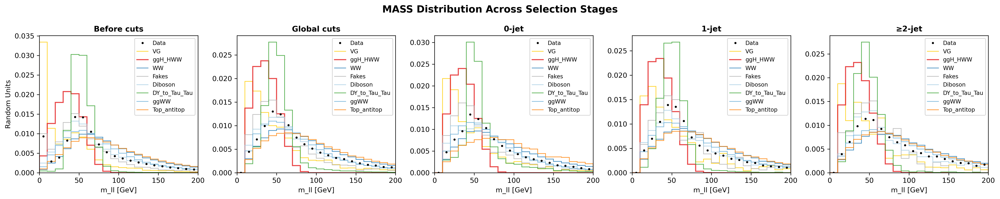


Plotting met...


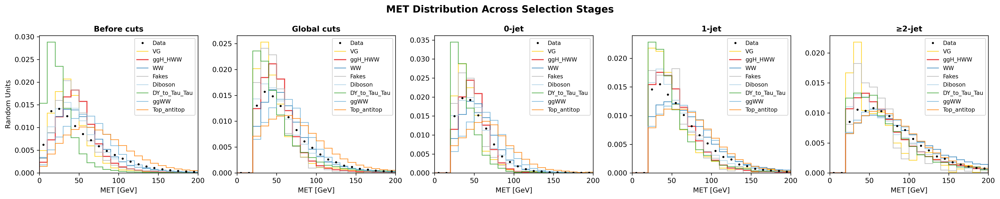


Plotting dphi...


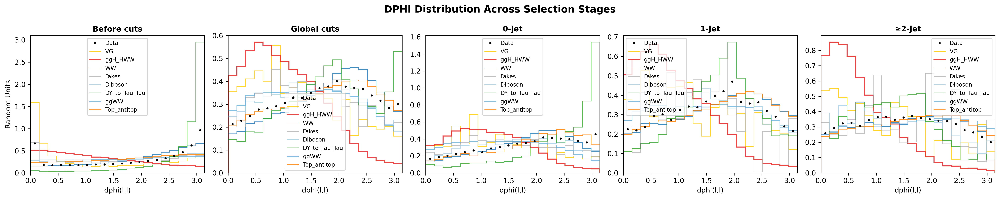


Plotting ptll...


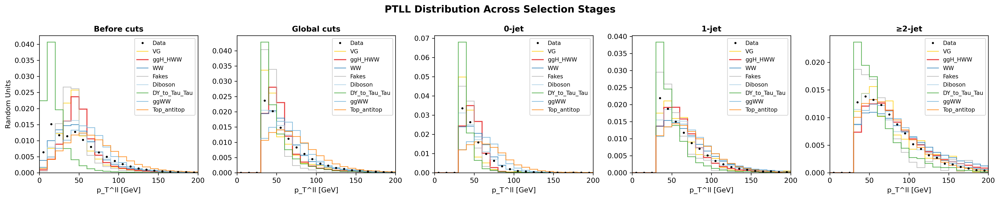


Plotting mt_higgs...


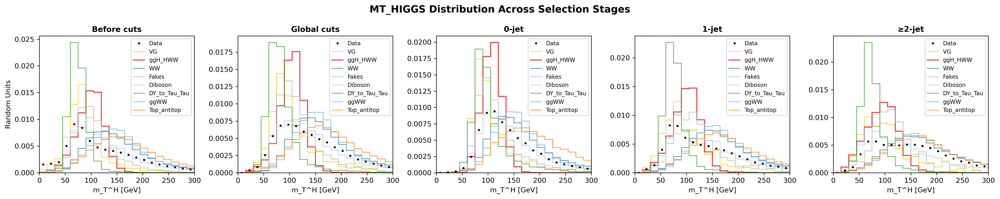


Plotting mt_l2_met...


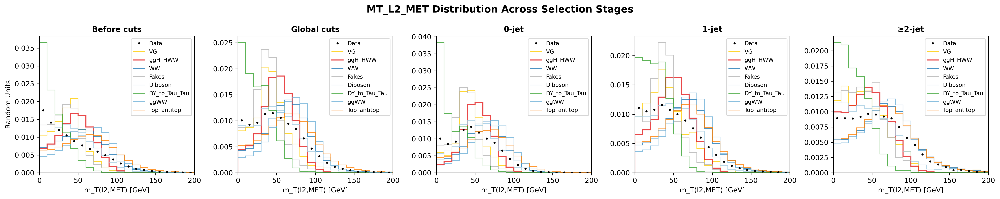


Plotting mjj...


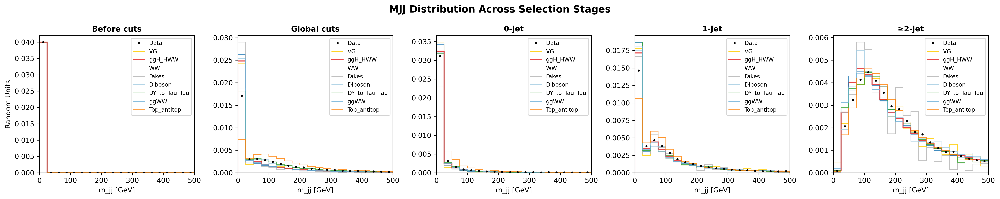


Plotting leading_pt...


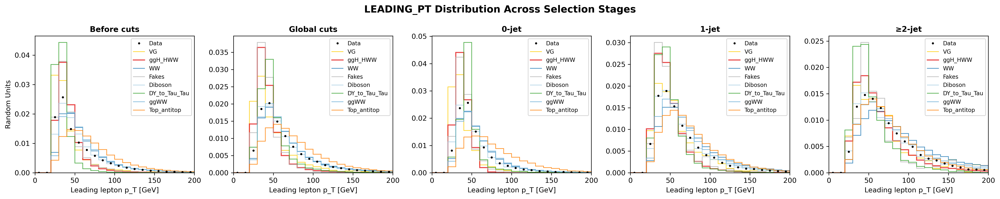


Plotting subleading_pt...


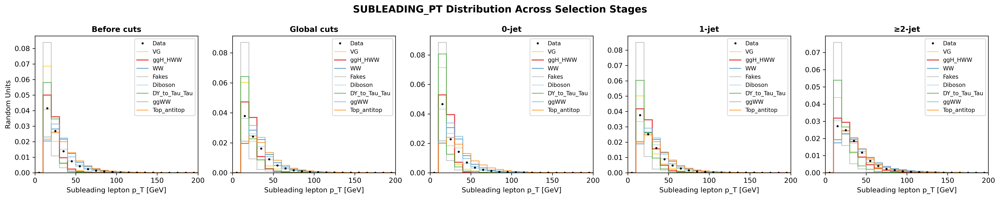

In [77]:
# Plot all variables
for var_name, var_props in variables_to_plots.items():
    print(f"\nPlotting {var_name}...")
    fig = plot_stage_comparison(var_name, var_props, hist_data_final)
    plt.show()

## Stacked plots

Plotting mass in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_mass.png


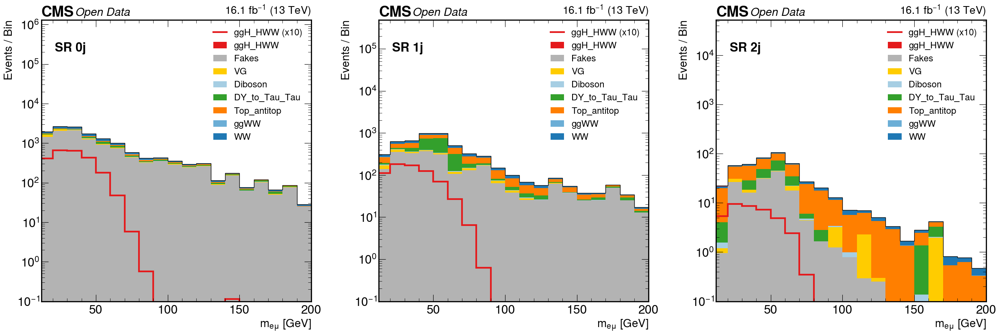

Plotting mass in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_mass.png


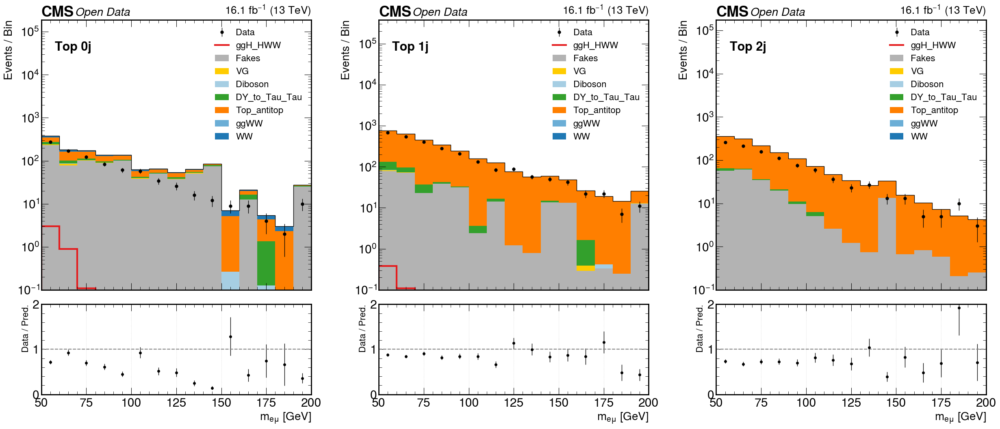

Plotting mass in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_mass.png


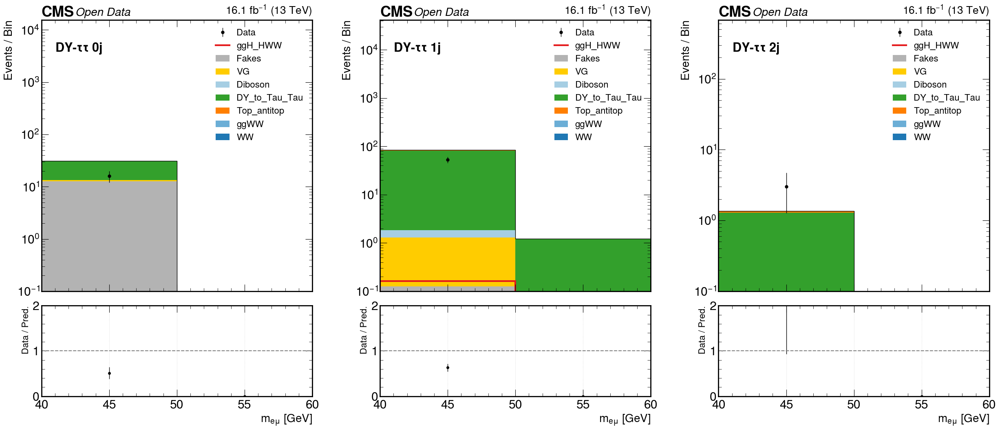

Plotting met in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_met.png


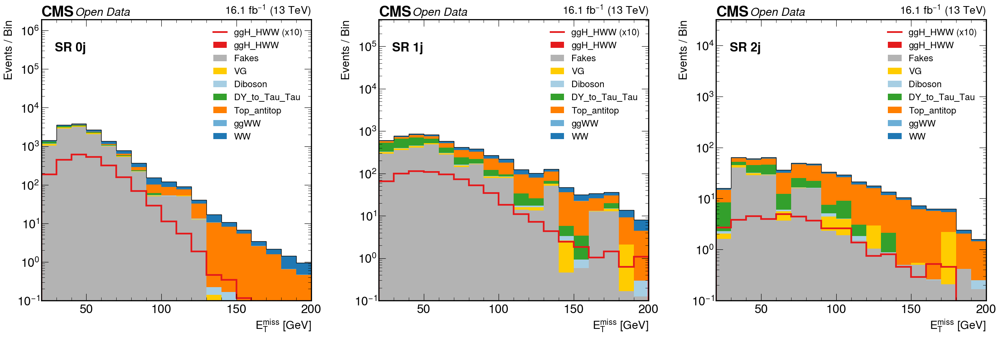

Plotting met in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_met.png


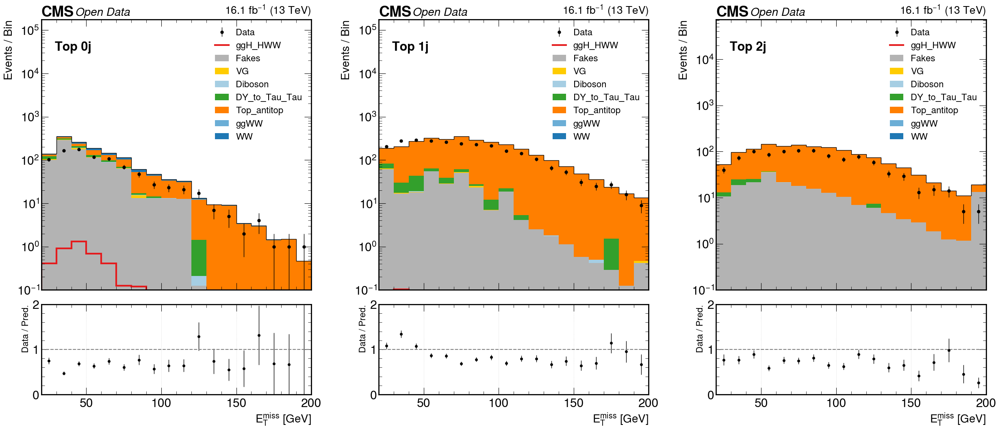

Plotting met in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_met.png


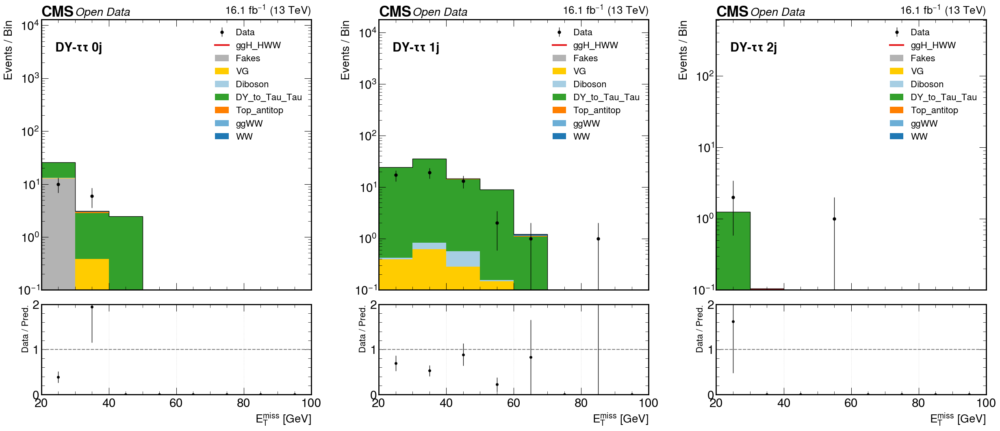

Plotting ptll in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_ptll.png


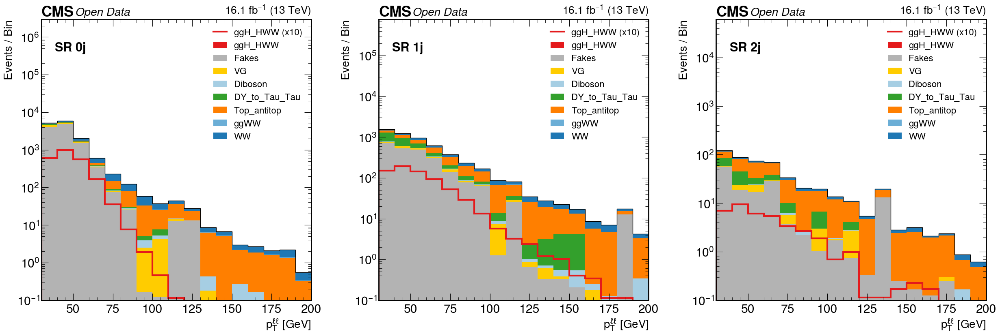

Plotting ptll in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_ptll.png


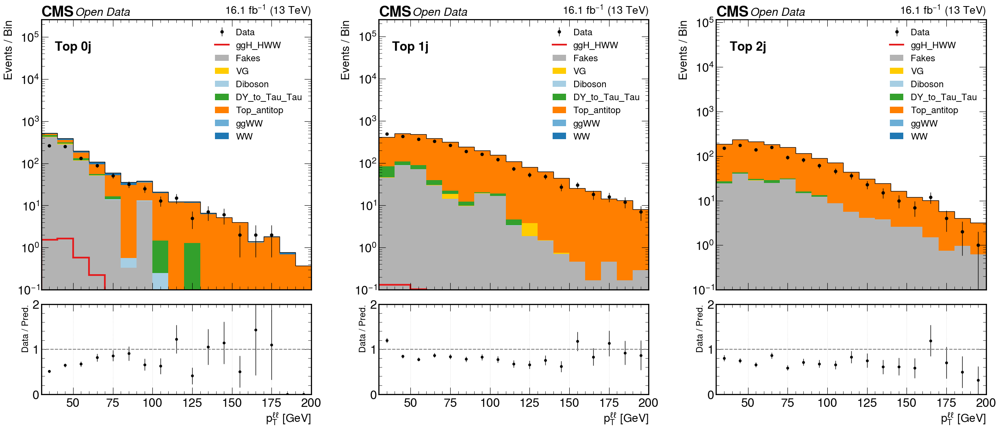

Plotting ptll in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_ptll.png


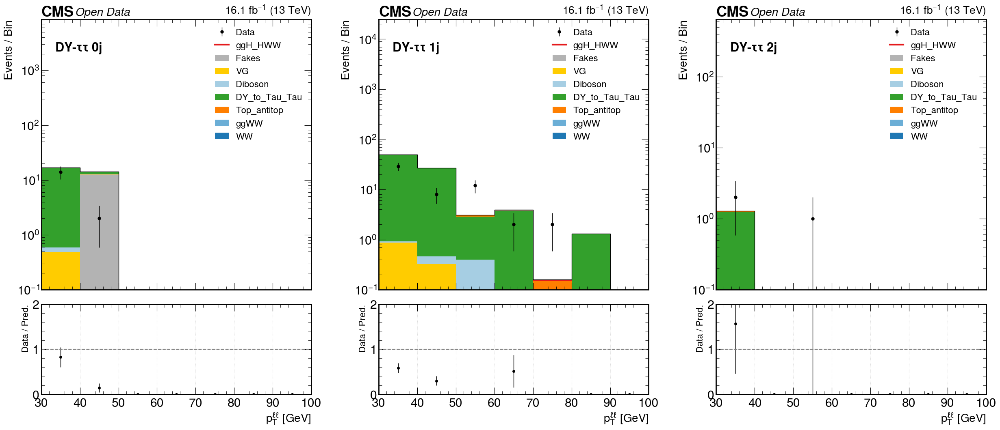

Plotting dphi in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_dphi.png


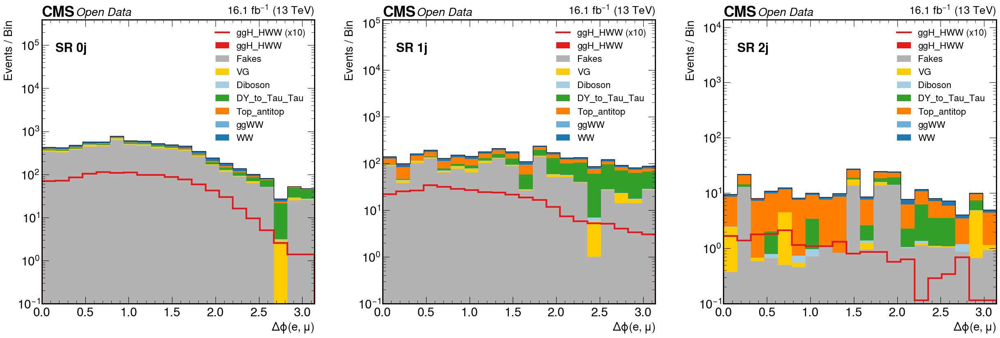

Plotting dphi in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_dphi.png


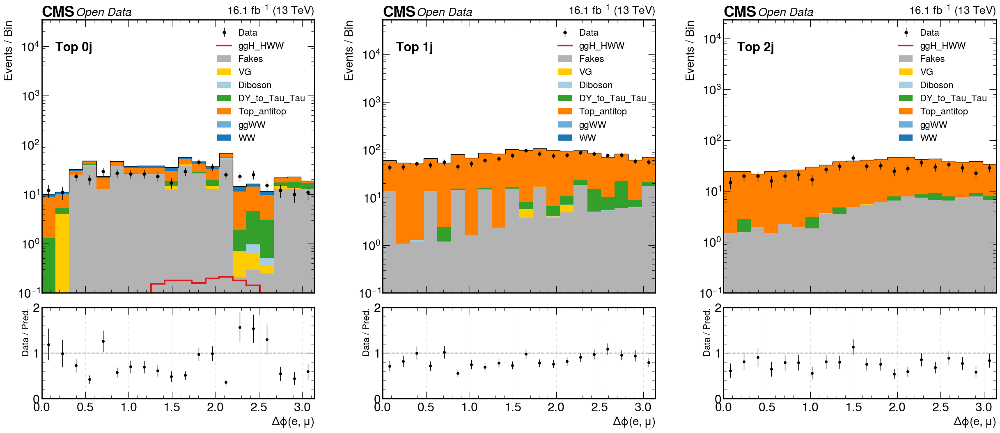

Plotting dphi in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_dphi.png


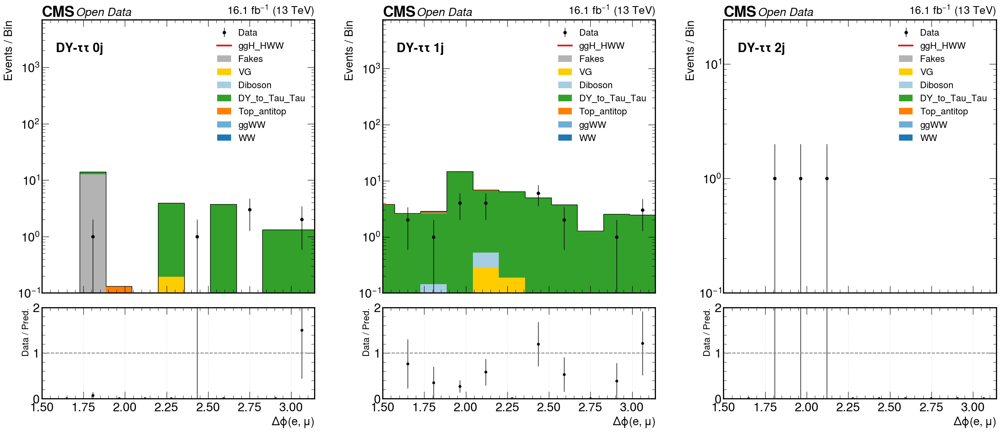

Plotting mt_higgs in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_mt_higgs.png


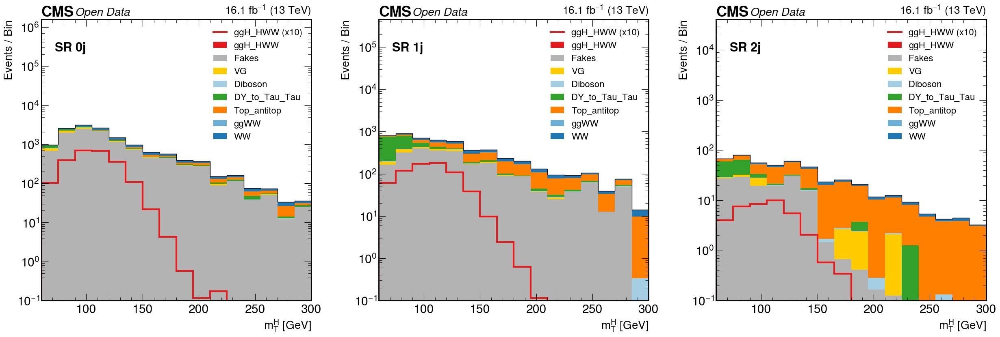

Plotting mt_higgs in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_mt_higgs.png


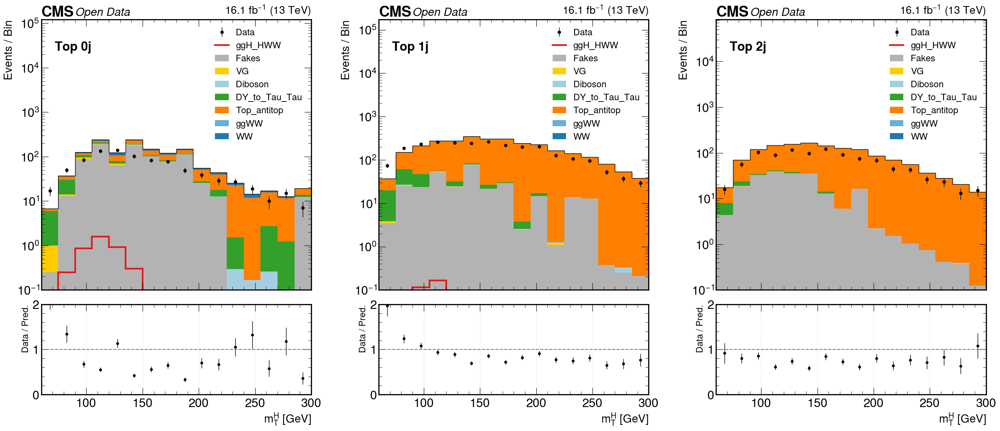

Plotting mt_higgs in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_mt_higgs.png


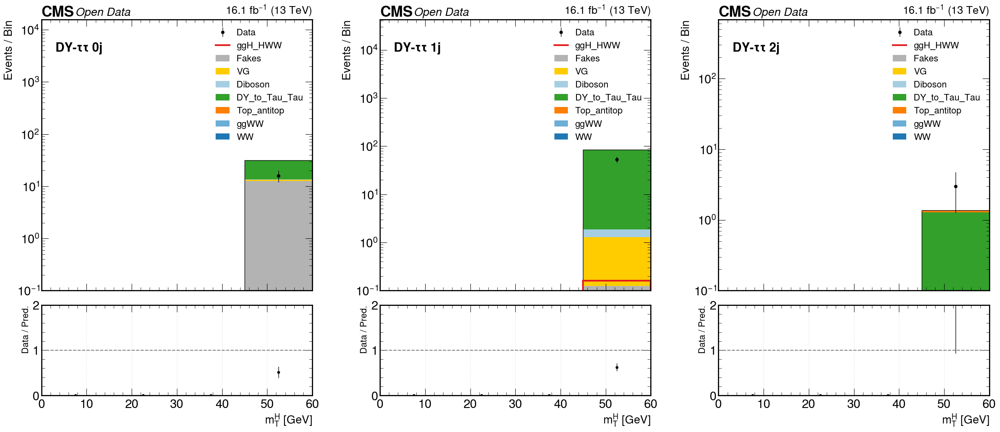

Plotting mt_l2_met in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_mt_l2_met.png


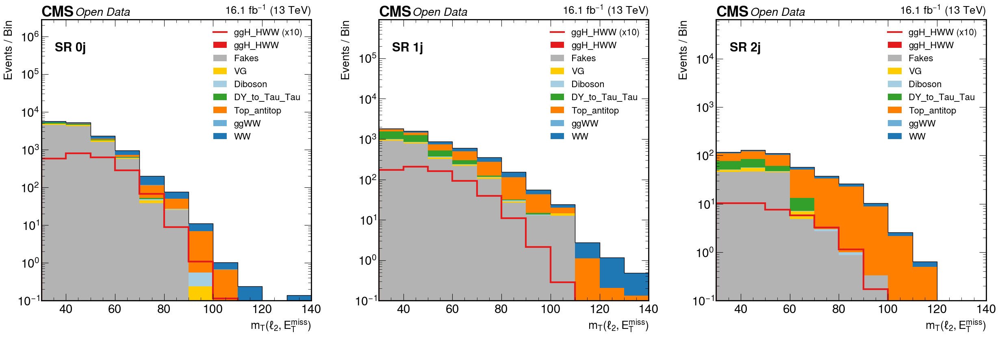

Plotting mt_l2_met in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_mt_l2_met.png


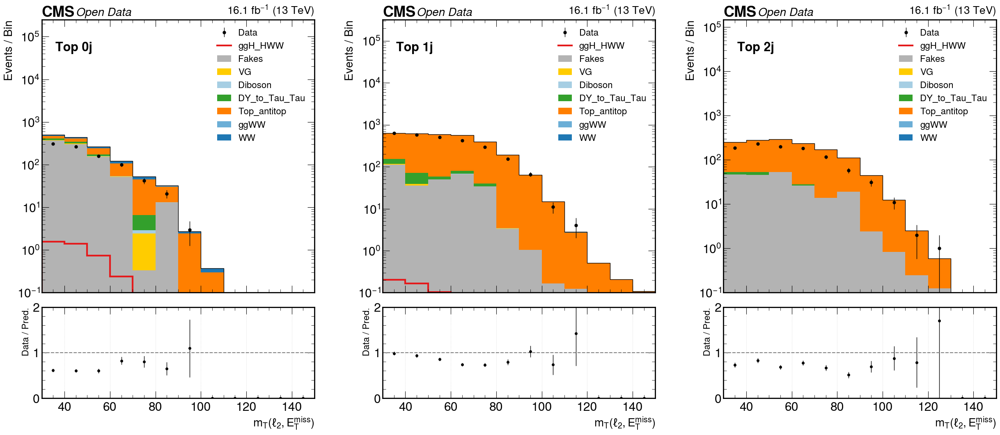

Plotting mt_l2_met in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_mt_l2_met.png


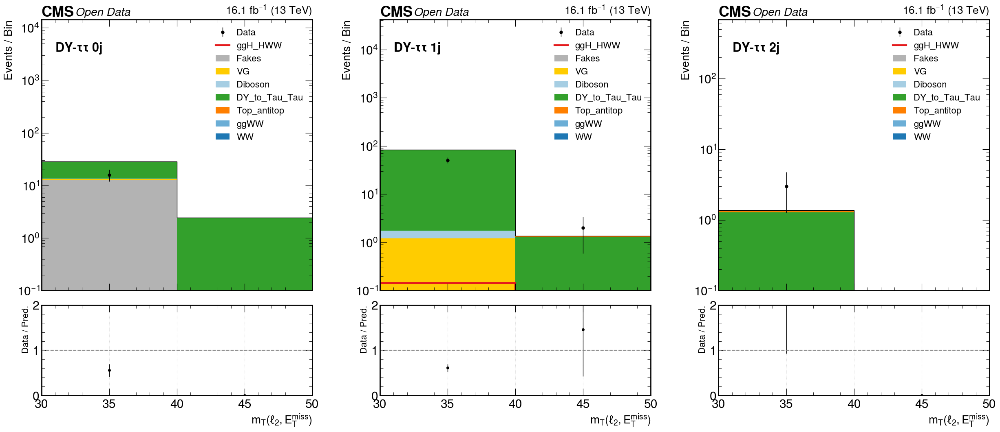

Plotting mjj in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_mjj.png


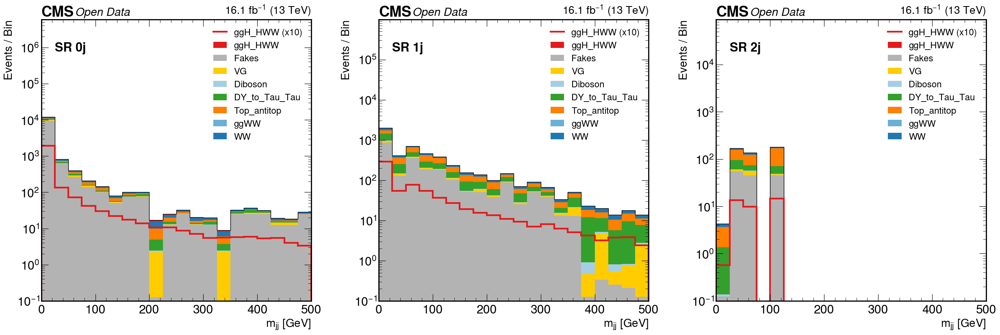

Plotting mjj in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_mjj.png


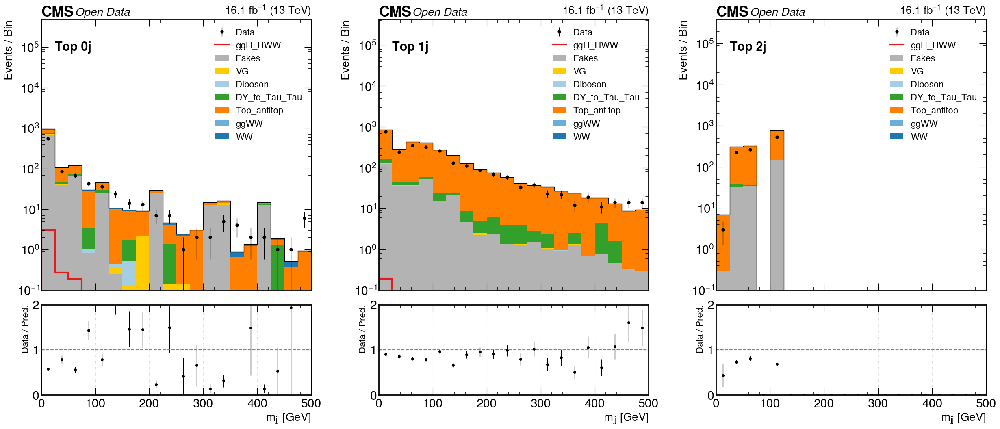

Plotting mjj in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_mjj.png


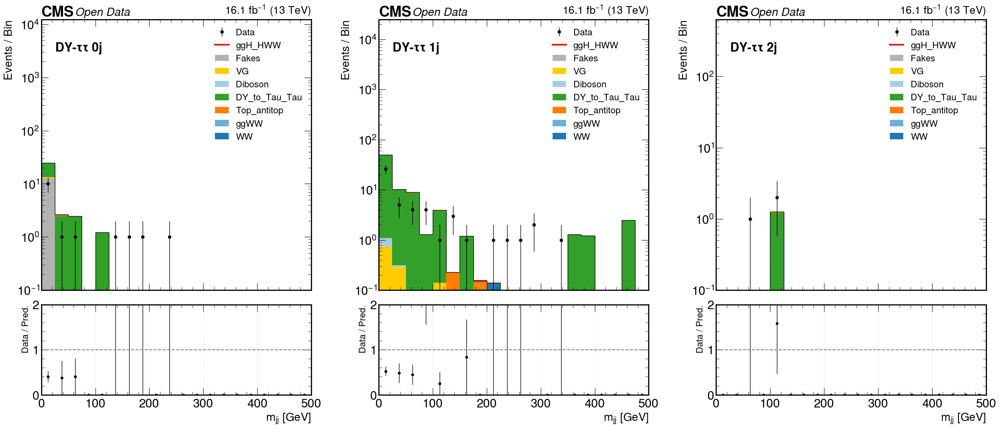

Plotting leading_pt in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_leading_pt.png


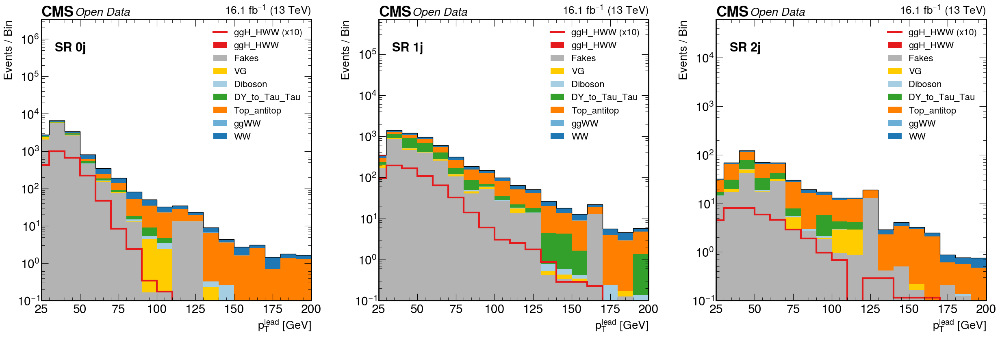

Plotting leading_pt in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_leading_pt.png


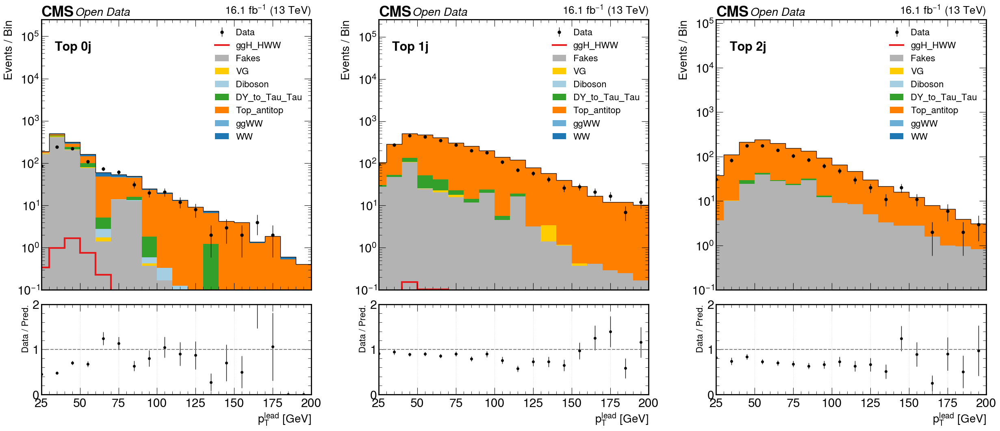

Plotting leading_pt in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_leading_pt.png


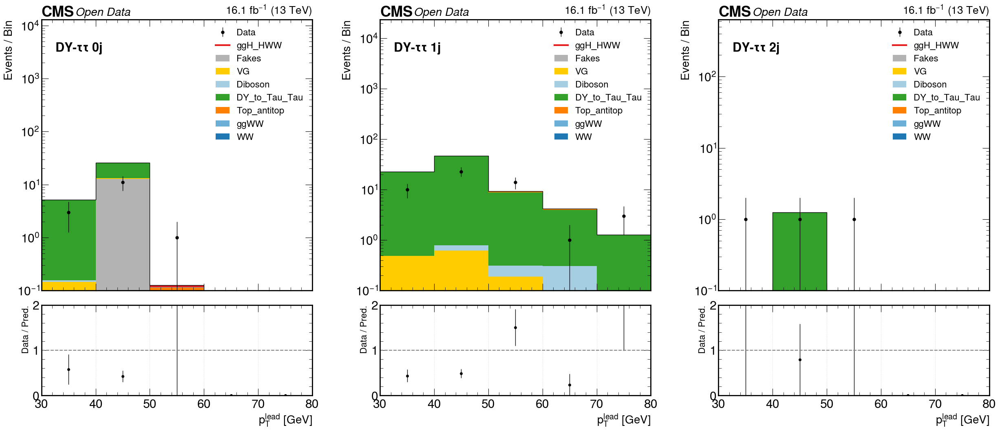

Plotting subleading_pt in Signal_Region...
Saved: plots_mplhep/CMS_Signal_Region_subleading_pt.png


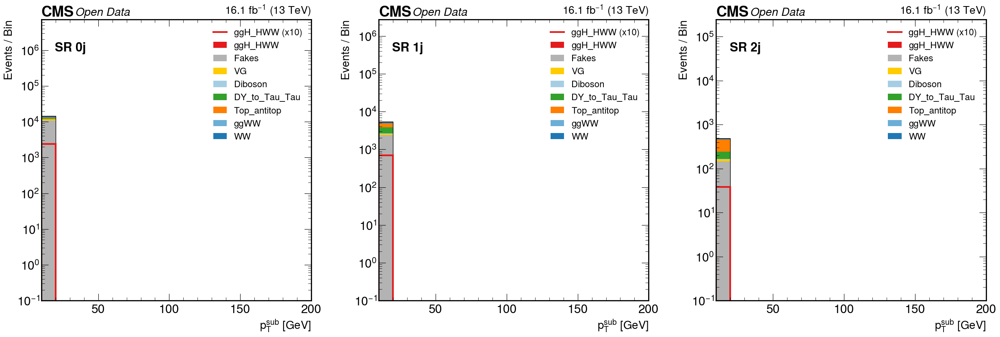

Plotting subleading_pt in Control_Region_Top...
Saved: plots_mplhep/CMS_Control_Region_Top_subleading_pt.png


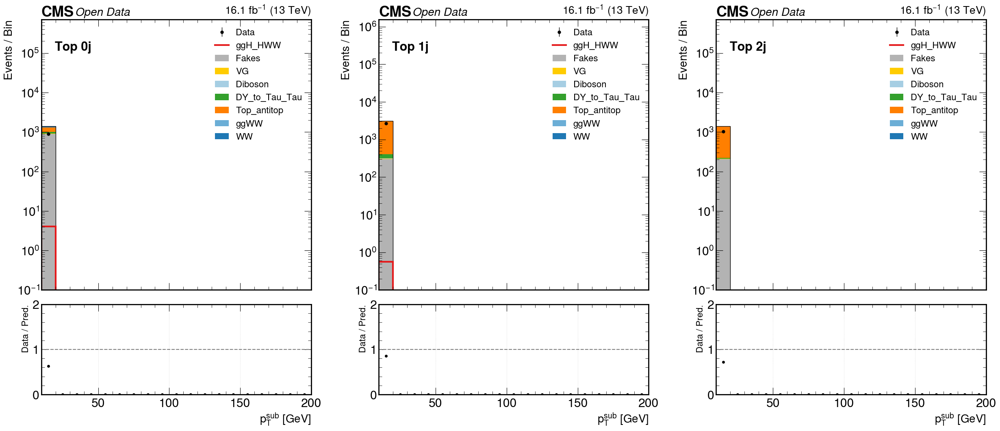

Plotting subleading_pt in Control_Region_Tau...
Saved: plots_mplhep/CMS_Control_Region_Tau_subleading_pt.png


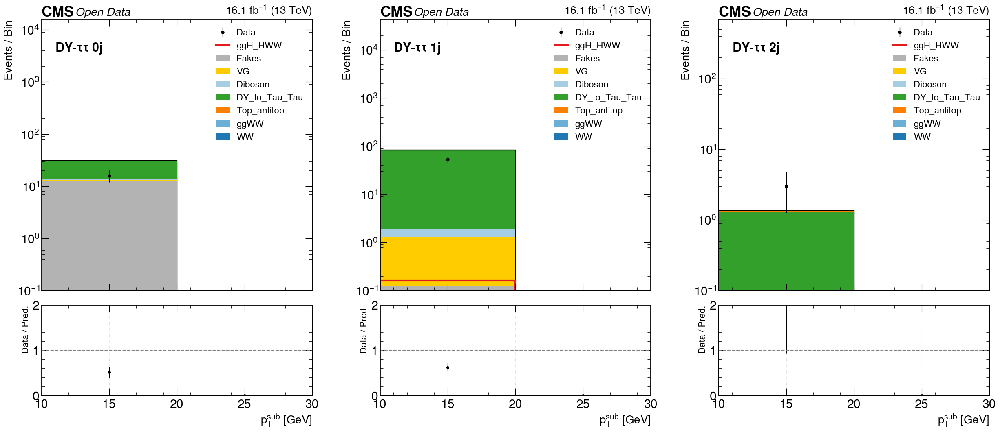

In [96]:
import matplotlib.pyplot as plt
import mplhep as hep
import numpy as np
import os

# 1. CONFIGURATION
hep.style.use("CMS")

PLOT_SETTINGS = {
    # GROUP 1: SIGNAL REGION 
    "Signal_Region": {
        "plot_data": False, 
        "stages": [('SR_0jet', 'SR 0j'), ('SR_1jet', 'SR 1j'), ('SR_2jet', 'SR 2j')],
        "variables": {
            "mass":          {"log": True,  "xlim": (12, 200),  "ylim": (0.01, 5000)},
            "ptll":          {"log": True,  "xlim": (30, 200),  "ylim": (0.01, 5000)},
            "met":           {"log": True,  "xlim": (20, 200),  "ylim": (0.01, 5000)},
            "mt_higgs":      {"log": True,  "xlim": (60, 300),  "ylim": None},
            "mt_l2_met":     {"log": True,  "xlim": (30, 140),  "ylim": None},
            "mjj":           {"log": True,  "xlim": (0, 500),   "ylim": None}, 
            "dphi":          {"log": True,  "xlim": (0, 3.14),  "ylim": (0.01, 1000)},
            "leading_pt":    {"log": True,  "xlim": (25, 200),  "ylim": None},
            "subleading_pt": {"log": True,  "xlim": (10, 200),  "ylim": None},
        }
    },

    # GROUP 2: TOP CONTROL REGION (Data Visible)
    "Control_Region_Top": {
        "plot_data": True,
        "stages": [('CR_top_0jet', 'Top 0j'), ('CR_top_1jet', 'Top 1j'), ('CR_top_2jet', 'Top 2j')],
        "variables": {
            "mass":          {"log": True, "xlim": (50, 200),  "ylim": (1, 5000)},
            "ptll":          {"log": True, "xlim": (30, 200),  "ylim": (1, 2000)},
            "met":           {"log": True, "xlim": (20, 200),  "ylim": None},
            "mt_higgs":      {"log": True, "xlim": (60, 300),  "ylim": (1, 5000)},
            "mt_l2_met":     {"log": True, "xlim": (30, 150),  "ylim": None},
            "mjj":           {"log": True, "xlim": (0, 500),   "ylim": None},
            "dphi":          {"log": True, "xlim": (0, 3.14),  "ylim": (1, 1000)},
            "leading_pt":    {"log": True, "xlim": (25, 200),  "ylim": None},
            "subleading_pt": {"log": True, "xlim": (10, 200),  "ylim": None},
        }
    },

    # GROUP 3: TAU CONTROL REGION (Data Visible)
    "Control_Region_Tau": {
        "plot_data": True,
        "stages": [('CR_tau_0jet', r'DY-$\tau\tau$ 0j'), ('CR_tau_1jet', r'DY-$\tau\tau$ 1j'), ('CR_tau_2jet', r'DY-$\tau\tau$ 2j')],
        "variables": {
            "mass":          {"log": True, "xlim": (40, 60),   "ylim": (0.01, 1000)},
            "ptll":          {"log": True, "xlim": (30, 100),  "ylim": (0.01, 1000)},
            "met":           {"log": True, "xlim": (20, 100),   "ylim": (0.01, 1000)},
            "mt_higgs":      {"log": True, "xlim": (0, 60),    "ylim": (0.01, 1000)},
            "mt_l2_met":     {"log": True, "xlim": (30, 50),   "ylim": (0.01, 1000)},
            "mjj":           {"log": True, "xlim": (0, 500),   "ylim": None},
            "dphi":          {"log": True, "xlim": (1.5, 3.14),  "ylim": (0.01, 1000)},
            "leading_pt":    {"log": True, "xlim": (30, 80),  "ylim": (0.01, 1000)},
            "subleading_pt": {"log": True, "xlim": (10, 30),   "ylim": None},
        }
    }
}

VAR_LABELS = {
    'mass': r'$m_{e\mu}$ [GeV]',
    'met': r'$E_{\mathrm{T}}^{\mathrm{miss}}$ [GeV]',
    'ptll': r'$p_{\mathrm{T}}^{\ell\ell}$ [GeV]',
    'dphi': r'$\Delta\phi(e,\mu)$',
    'mt_higgs': r'$m_{\mathrm{T}}^{H}$ [GeV]',
    'mt_l2_met': r'$m_{\mathrm{T}}(\ell_2, E_{\mathrm{T}}^{\mathrm{miss}})$',
    'mjj': r'$m_{jj}$ [GeV]',
    'leading_pt': r'$p_{\mathrm{T}}^{\mathrm{lead}}$ [GeV]',
    'subleading_pt': r'$p_{\mathrm{T}}^{\mathrm{sub}}$ [GeV]',
}

# 2. HELPER FUNCTIONS

def get_histogram_data(hist_data_all, sample, stage, variable):
    """Safely extract numpy arrays from the histogram dictionary."""
    try:
        h = hist_data_all[sample][stage][variable]
        if hasattr(h, 'to_numpy'): return h.to_numpy()
        elif hasattr(h, 'values'): return h.values(), h.axes[0].edges
        else: return None, None
    except (KeyError, AttributeError): return None, None

def stacked_plots(variable, hist_data_all, output_dir="plots"):
    os.makedirs(output_dir, exist_ok=True)
    xlabel = VAR_LABELS.get(variable, variable)
    
    # --- PREPARE SAMPLES ---
    backgrounds = [s for s in SAMPLES if not SAMPLES[s]['is_signal'] and s != 'Data']
    backgrounds.sort(key=lambda s: SAMPLES[s].get("stack_order", 0))
    signal = next((s for s in SAMPLES if SAMPLES[s]['is_signal']), None)
    data_sample = 'Data'

    # --- MAIN LOOP OVER REGIONS ---
    for region_name, config in PLOT_SETTINGS.items():
        var_config = config['variables'].get(variable)
        if not var_config: continue

        print(f"Plotting {variable} in {region_name}...")
        
        stages = config['stages']
        use_log = var_config.get('log', False)
        set_xlim = var_config.get('xlim', None)
        set_ylim = var_config.get('ylim', None)
        
        # --- BLINDING LOGIC ---
        is_signal_region = "Signal" in region_name
        plot_data = False if is_signal_region else config.get('plot_data', True)

        # --- CANVAS SETUP ---
        if plot_data:
            # 2 Rows (Main + Ratio)
            fig, axes = plt.subplots(2, 3, figsize=(30, 12), 
                                     gridspec_kw={'height_ratios': [3, 1], 'hspace': 0.08, 'wspace': 0.25},
                                     sharex='col')
            row_axes = axes[0]
            ratio_axes = axes[1]
        else:
            # 1 Row (Main only)
            fig, axes = plt.subplots(1, 3, figsize=(30, 9), 
                                     gridspec_kw={'wspace': 0.25},
                                     sharex='col')
            row_axes = axes
            ratio_axes = [None] * 3

        # --- LOOP OVER JET CATEGORIES ---
        for col_idx, (stage_key, stage_label) in enumerate(stages):
            ax_main = row_axes[col_idx]
            ax_ratio = ratio_axes[col_idx]
            
            # --- DATA COLLECTION ---
            stack_vals, stack_colors, stack_labels = [], [], []
            edges = None
            
            # 1. Load Backgrounds (for Stack)
            for s in backgrounds:
                vals, e = get_histogram_data(hist_data_all, s, stage_key, variable)
                if vals is not None:
                    stack_vals.append(vals)
                    stack_colors.append(SAMPLES[s].get("color", "gray"))
                    stack_labels.append(s)
                    if edges is None: edges = e
            
            # 2. Load Signal (for Stack AND Overlay)
            sig_vals = None
            if signal:
                sig_vals, _ = get_histogram_data(hist_data_all, signal, stage_key, variable)
                
                # FIX: ALWAYS ADD TO STACK (Unscaled) if valid
                if sig_vals is not None and edges is not None:
                    stack_vals.append(sig_vals)
                    stack_colors.append(SAMPLES[signal].get("color", "red"))
                    stack_labels.append(signal)

            # If no data found at all
            if edges is None:
                ax_main.text(0.5, 0.5, "No Data", ha='center', transform=ax_main.transAxes)
                continue

            # 3. Load Data
            data_vals = None
            if plot_data:
                data_vals, _ = get_histogram_data(hist_data_all, data_sample, stage_key, variable)

            # --- PLOT MAIN ---
            
            # A. Draw Full Stack (Backgrounds + Signal x1)
            if stack_vals:
                hep.histplot(stack_vals, bins=edges, stack=True, histtype='fill',
                             color=stack_colors, label=stack_labels, ax=ax_main)
                # Outline
                total_stack = np.sum(stack_vals, axis=0)
                hep.histplot(total_stack, bins=edges, histtype='step', color='black', linewidth=1, ax=ax_main)
            
            # B. Draw Signal Overlay (Magnified in SR, Normal in CR)
            if sig_vals is not None:
                # Scale logic: x10 in Signal Region, x1 in Control Regions
                sig_scale = 10 if is_signal_region else 1
                
                # Create label
                if sig_scale > 1:
                    sig_lbl = f"{signal} (x{sig_scale})"
                else:
                    sig_lbl = f"{signal}" # Just "ggH_HWW" in CR

                hep.histplot(sig_vals * sig_scale, bins=edges, histtype='step',
                             color=SAMPLES[signal].get("color", "red"), 
                             linewidth=3, label=sig_lbl, ax=ax_main)

            # C. Draw Data Points
            if data_vals is not None:
                yerr = np.sqrt(data_vals); yerr[data_vals == 0] = 0
                hep.histplot(data_vals, bins=edges, histtype='errorbar', color='black', 
                             label='Data', yerr=yerr, marker='o', markersize=5, ax=ax_main, zorder=10)

            # --- PLOT RATIO ---
            if plot_data and data_vals is not None and stack_vals:
                safe_denom = np.where(total_stack == 0, 1e-9, total_stack)
                ratio = data_vals / safe_denom
                ratio_err = np.abs(np.sqrt(data_vals) / safe_denom) 
                
                hep.histplot(ratio, bins=edges, histtype='errorbar', yerr=ratio_err,
                             color='black', marker='o', markersize=4, ax=ax_ratio)
                ax_ratio.axhline(1, color='gray', linestyle='--')
                
                ax_ratio.set_ylim(0.0, 2.0)
                ax_ratio.set_ylabel("Data / Pred.", fontsize=16)
                ax_ratio.set_xlabel(xlabel, fontsize=20)
                ax_ratio.grid(True, linestyle=':', alpha=0.5)

            # --- STYLING ---
            
            # 1. CMS Logo & Lumi (APPLIED TO EVERY COLUMN)
            hep.cms.label(ax=ax_main, loc=0, data=True, label="Open Data", 
                          lumi=16.1, fontsize=20)

            ax_main.text(0.05, 0.92, stage_label, transform=ax_main.transAxes, fontsize=22, fontweight='bold', va='top')
            ax_main.set_ylabel("Events / Bin", fontsize=20)
            
            # Scales
            if use_log:
                ax_main.set_yscale('log')
                max_val = np.max(total_stack) if len(total_stack)>0 else 1
                ax_main.set_ylim(0.1, max_val * 500)
            else:
                max_val = np.max(total_stack) if len(total_stack)>0 else 1
                ax_main.set_ylim(0, max_val * 1.5)

            if set_xlim: ax_main.set_xlim(set_xlim)
            if set_ylim and not use_log: ax_main.set_ylim(set_ylim)

            if not plot_data:
                ax_main.set_xlabel(xlabel, fontsize=20)

            # 2. LEGEND 
            handles, labels = ax_main.get_legend_handles_labels()
            
            by_label = dict(zip(labels, handles))
            
            final_h, final_l = [], []
            if 'Data' in by_label: 
                final_h.append(by_label['Data']); final_l.append('Data')
            
            # Check for magnified signal label
            for lbl in by_label:
                if "(x" in lbl: 
                    final_h.append(by_label[lbl]); final_l.append(lbl)
            
            if signal in by_label and signal not in final_l:
                 final_h.append(by_label[signal]); final_l.append(signal)

            for lbl in reversed(list(by_label.keys())):
                
                if lbl not in final_l: 
                    final_h.append(by_label[lbl]); final_l.append(lbl)
            
            ax_main.legend(final_h, final_l, loc='upper right', ncol=1, frameon=False, fontsize=16)

        # --- SAVE & SHOW ---
        fname = f"{output_dir}/CMS_{region_name}_{variable}.png"
        plt.savefig(fname, bbox_inches='tight', dpi=150)
        print(f"Saved: {fname}")
        plt.show()
        plt.close(fig)

# ==============================================================================
# 3. RUN
# ==============================================================================
for var in VAR_LABELS:
    stacked_plots(var, hist_data_final, output_dir="plots_mplhep")

### Helper Function

In [78]:
def get_backgrounds_and_signal():
    """Return list of background samples and signal sample sorted by stack_order"""
    
    # Get all background samples with their stack_order
    backgrounds = []
    for sample, props in SAMPLES.items():
        if not props["is_signal"] and props["stack_order"] >=0:
            backgrounds.append((sample, props["stack_order"]))
    
    # Sort by stack_order 
    backgrounds.sort(key=lambda x: x[1])
    backgrounds = [sample for sample, _ in backgrounds]
    
    # Get signal
    signal = None
    for sample, props in SAMPLES.items():
        if props["is_signal"]:
            signal = sample
            break
    
    return backgrounds, signal


def get_data_sample():
    """Return the data sample"""
    return 'Data'


def get_histogram_data(hist_data_all, sample, stage, hist_key):
    """Get histogram data, return None if not available."""
    try:
        hist = hist_data_all[sample][stage][hist_key]
        if hist.sum() == 0:
            return None, None
        
        values = hist.values()
        edges = hist.axes[0].edges
        
        return values, edges
    except (KeyError, AttributeError):
        return None, None

### plotting function

## MASTER PLOTTING CONFIGURATION 

In [80]:
# %%
# 1. MASTER PLOTTING CONFIGURATION 

PLOT_SETTINGS = {
    # GROUP 1: SIGNAL REGION 
    "Signal_Region": {
        "plot_data": True,
        "stages": [('SR_0jet', 'SR 0j'), ('SR_1jet', 'SR 1j'), ('SR_2jet', 'SR 2j')],
        # "ylim_factor": 1.6,  
        
        "variables": {
            "mass":          {"log": True, "xlim": (12, 200),  "ylim": (0.01,5000)},
            "ptll":          {"log": True,  "xlim": (30, 200),  "ylim": (0.01,5000)},
            "met":           {"log": True, "xlim": (20, 200),  "ylim": (0.01,5000)},
            "mt_higgs":      {"log": True, "xlim": (60, 400),  "ylim": None},
            "mt_l2_met":     {"log": True, "xlim": (30, 150),  "ylim": None},
            "mjj":           {"log": True, "xlim": (0, 500),   "ylim": None}, 
            "dphi":          {"log": True, "xlim": (0, 3.14),  "ylim": (0.01,1000)},
            "leading_pt":    {"log": True, "xlim": (25, 200),  "ylim": None},
            "subleading_pt": {"log": True, "xlim": (10, 200),  "ylim": None},
        }
    },

    # --------------------------------------------------------------------------
    # GROUP 2: TOP CONTROL REGION (Unblinded, High Energy Tails)
    # --------------------------------------------------------------------------
    "Control_Region_Top": {
        "plot_data": True,
        "stages": [('CR_top_0jet', 'Top 0j'), ('CR_top_1jet', 'Top 1j'), ('CR_top_2jet', 'Top 2j')],
        # "ylim_factor": 1.4,

        "variables": {
            "mass":          {"log": True, "xlim": (50, 200),  "ylim": (1,5000)}, # Extended for Top tails
            "ptll":          {"log": True, "xlim": (30, 200),  "ylim": (1,2000)},
            "met":           {"log": True, "xlim": (20, 200),   "ylim": None},
            "mt_higgs":      {"log": True, "xlim": (50, 300),   "ylim": (1,5000)}, # No cut in Top CR
            "mt_l2_met":     {"log": True, "xlim": (30, 200),   "ylim": None},
            "mjj":           {"log": True, "xlim": (0, 500),   "ylim": None}, # Top has real b-jets
            "dphi":          {"log": True, "xlim": (0, 3.14),  "ylim": (1,1000)},
            "leading_pt":    {"log": True, "xlim": (25, 200),  "ylim": None}, # Harder spectrum
            "subleading_pt": {"log": True, "xlim": (10, 200),  "ylim": None},
        }
    },

    # --------------------------------------------------------------------------
    # GROUP 3: TAU CONTROL REGION 
    # --------------------------------------------------------------------------
    "Control_Region_Tau": {
        "plot_data": True,
        "stages": [('CR_tau_0jet', r'DY-$\tau\tau$ 0j'), ('CR_tau_1jet', r'DY-$\tau\tau$ 1j'), ('CR_tau_2jet', r'DY-$\tau\tau$ 2j')],
        # "ylim_factor": 100, # High factor because of log scale default

        "variables": {
            "mass":          {"log": True,  "xlim": (40, 80),  "ylim": (0.01, 1000)}, # Focus on Z peak (91 GeV)
            "ptll":          {"log": True,  "xlim": (30, 140),  "ylim": (0.01, 1000)},
            "met":           {"log": True,  "xlim": (0, 100),   "ylim": (0.01, 1000)},
            "mt_higgs":      {"log": True, "xlim": (0, 60),   "ylim": (0.01,1000)}, # Cut is < 60 usually
            "mt_l2_met":     {"log": True, "xlim": (0, 120),   "ylim": (0.01,1000)},
            "mjj":           {"log": True, "xlim": (0, 500),   "ylim": None}, # Usually low jet activity
            "dphi":          {"log": True, "xlim": (0, 3.14),  "ylim": (0.01, 1000)}, # Back-to-back topology
            "leading_pt":    {"log": True,  "xlim": (25, 180),  "ylim": (0.01, 1000)},
            "subleading_pt": {"log": True,  "xlim": (10, 30),  "ylim": None},
        }
    }
}

# Variable Labels (Shared across regions)
VAR_LABELS = {
    'mass': r'$m_{e\mu}$ [GeV]',
    'met': r'$E_{\mathrm{T}}^{\mathrm{miss}}$ [GeV]',
    'ptll': r'$p_{\mathrm{T}}^{\ell\ell}$ [GeV]',
    'dphi': r'$\Delta\phi(e,\mu)$',
    'mt_higgs': r'$m_{\mathrm{T}}^{H}$ [GeV]',
    'mt_l2_met': r'$m_{\mathrm{T}}(\ell_2, E_{\mathrm{T}}^{\mathrm{miss}})$',
    'mjj': r'$m_{jj}$ [GeV]',
    'leading_pt': r'$p_{\mathrm{T}}^{\mathrm{lead}}$ [GeV]',
    'subleading_pt': r'$p_{\mathrm{T}}^{\mathrm{sub}}$ [GeV]',
}

Plotting mass in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mass_Signal_Region.png


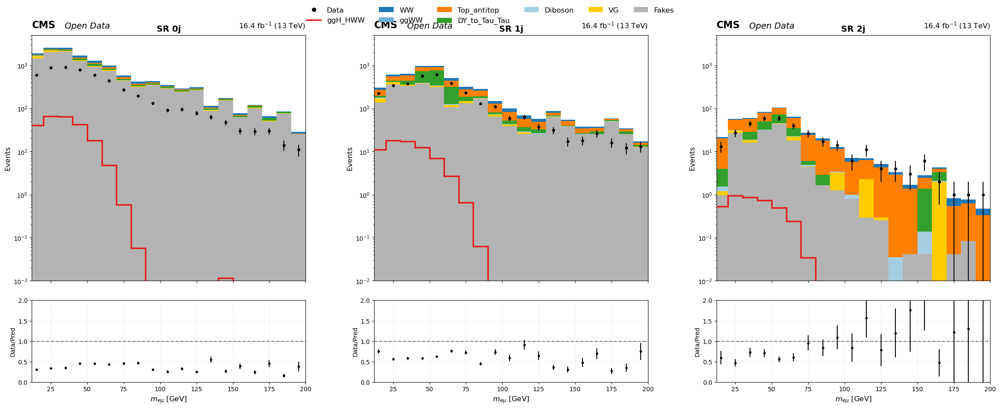

Plotting mass in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mass_Control_Region_Top.png


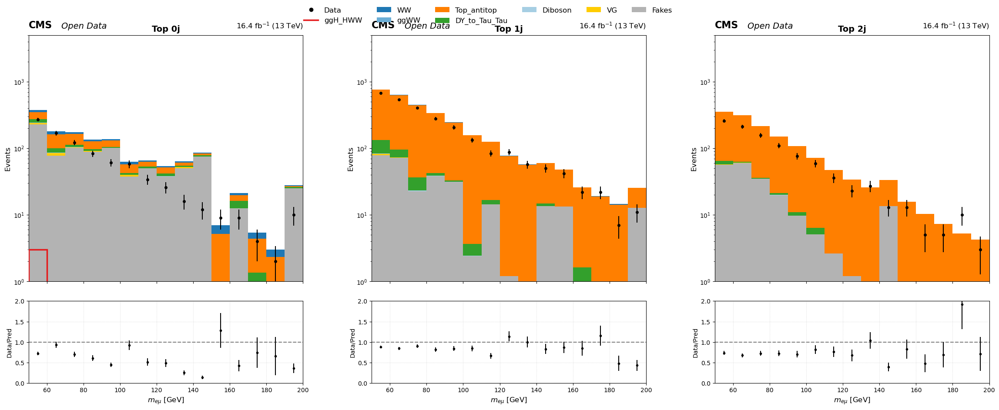

Plotting mass in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mass_Control_Region_Tau.png


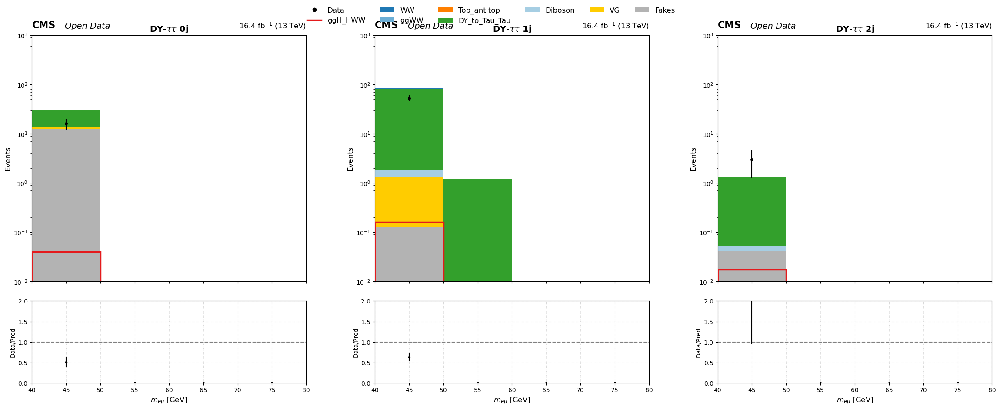

Plotting met in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/met_Signal_Region.png


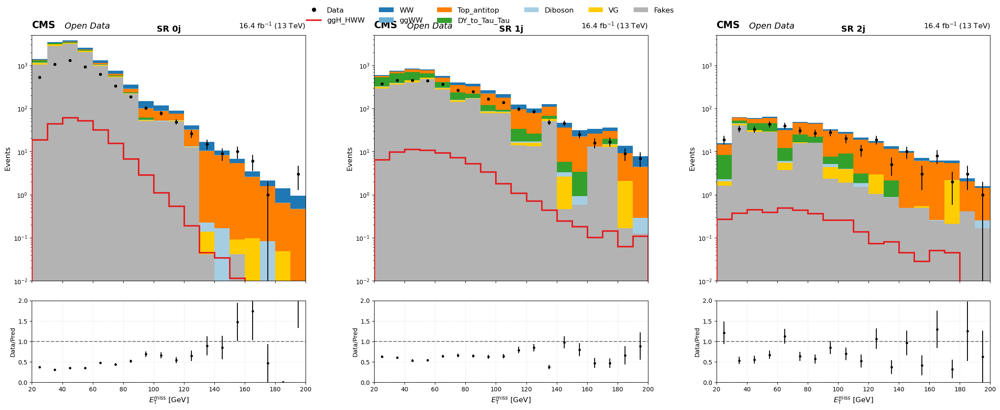

Plotting met in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/met_Control_Region_Top.png


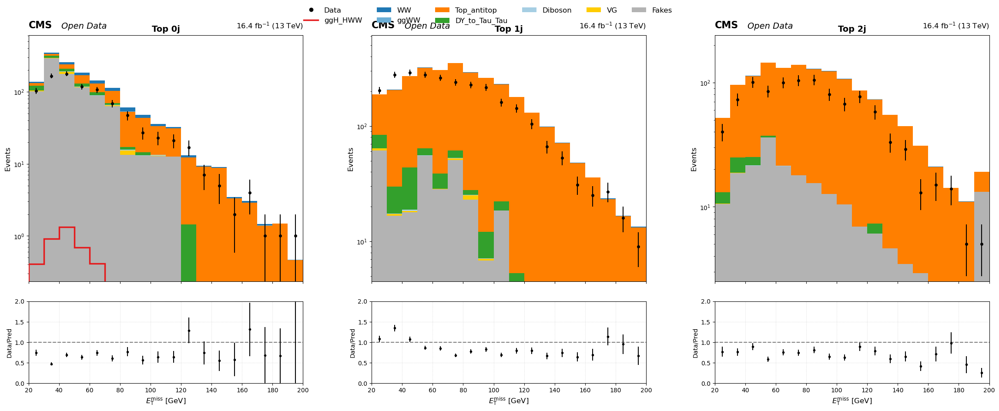

Plotting met in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/met_Control_Region_Tau.png


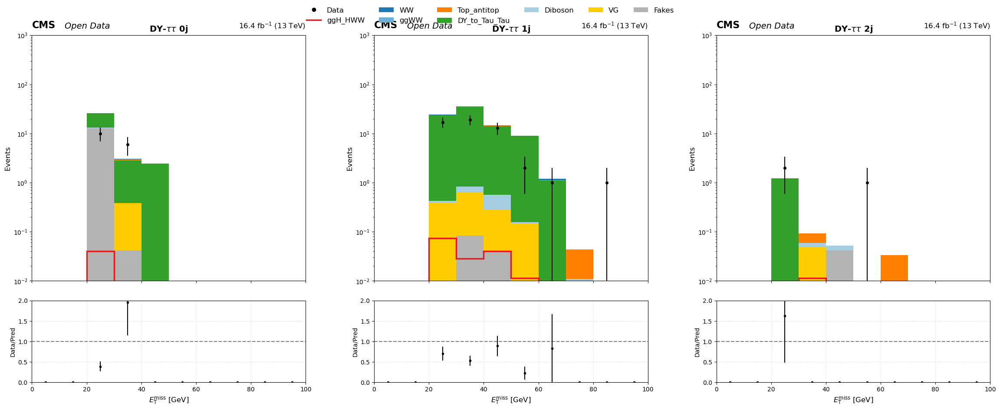

Plotting ptll in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/ptll_Signal_Region.png


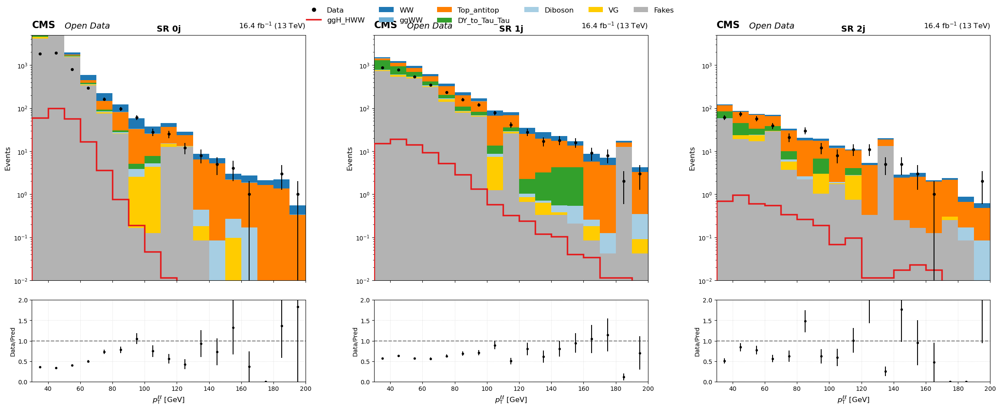

Plotting ptll in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/ptll_Control_Region_Top.png


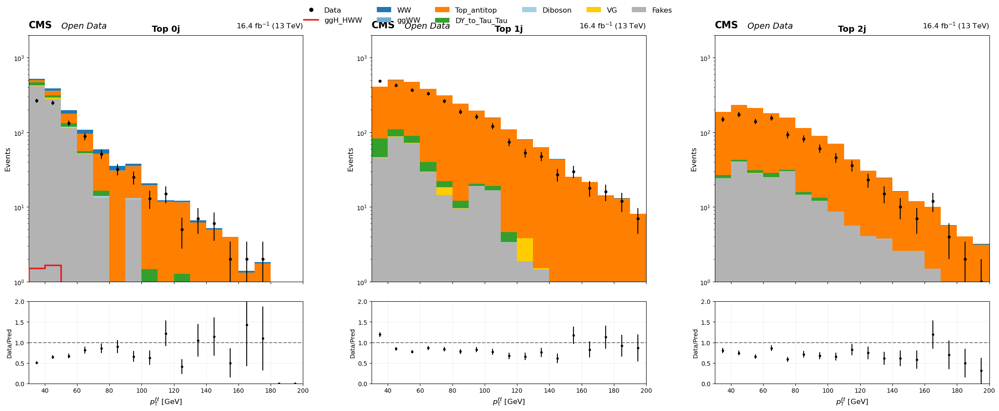

Plotting ptll in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/ptll_Control_Region_Tau.png


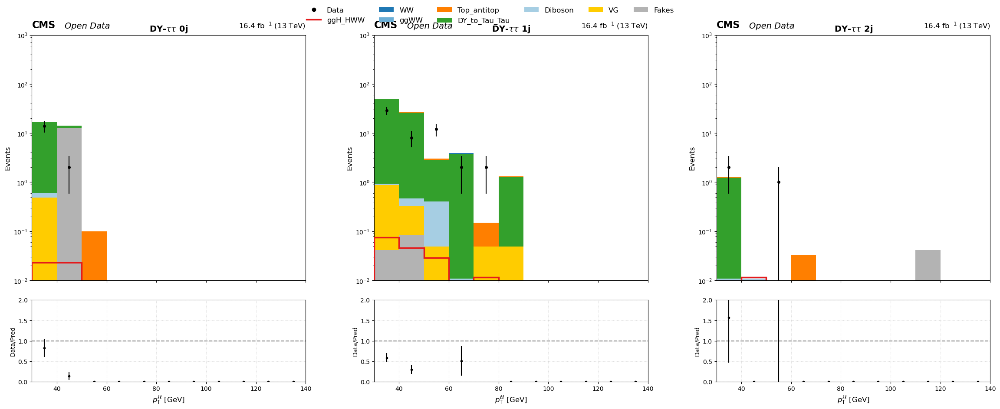

Plotting dphi in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/dphi_Signal_Region.png


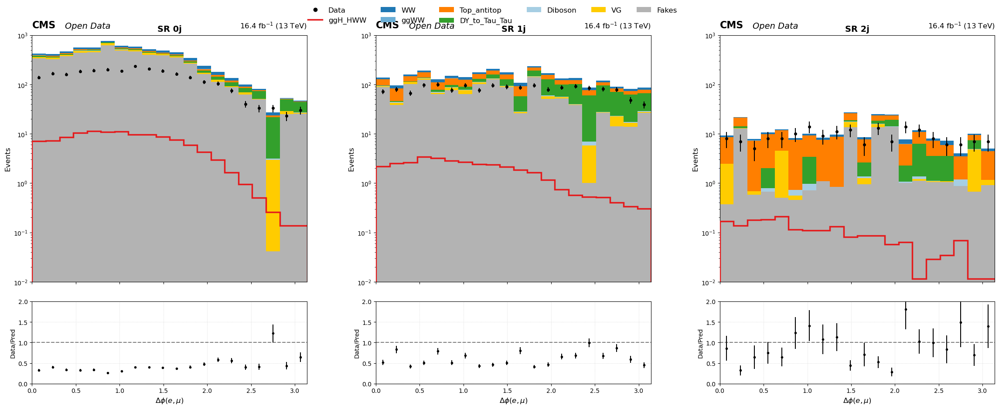

Plotting dphi in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/dphi_Control_Region_Top.png


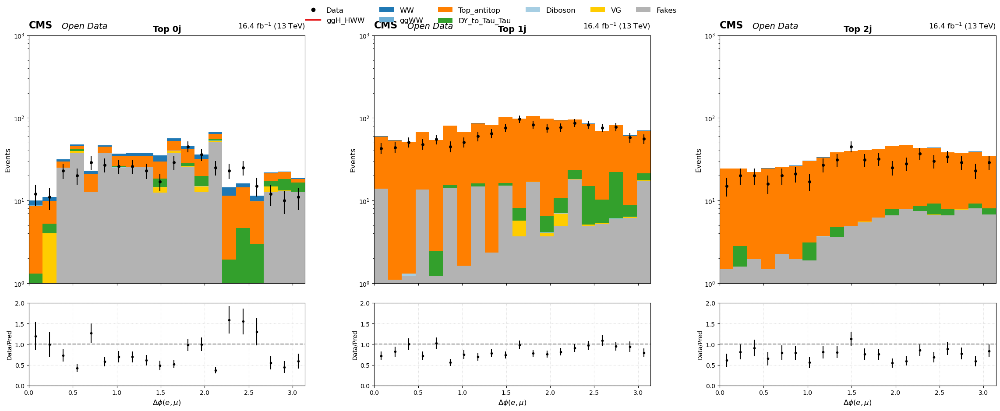

Plotting dphi in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/dphi_Control_Region_Tau.png


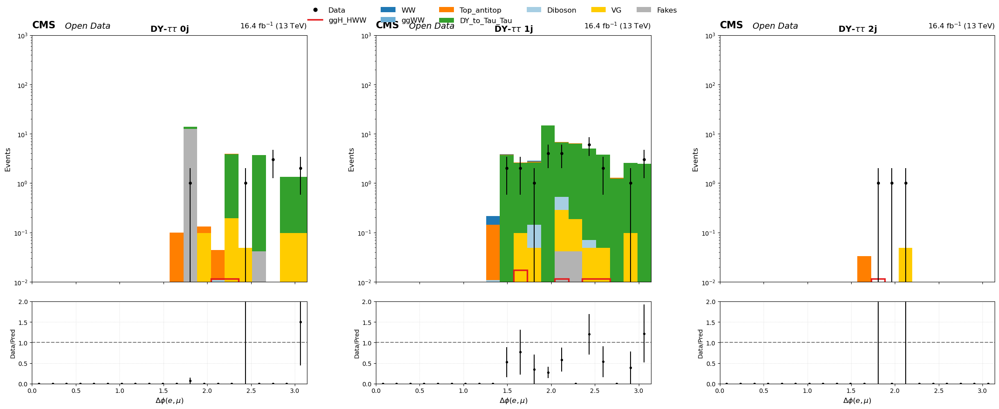

Plotting mt_higgs in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_higgs_Signal_Region.png


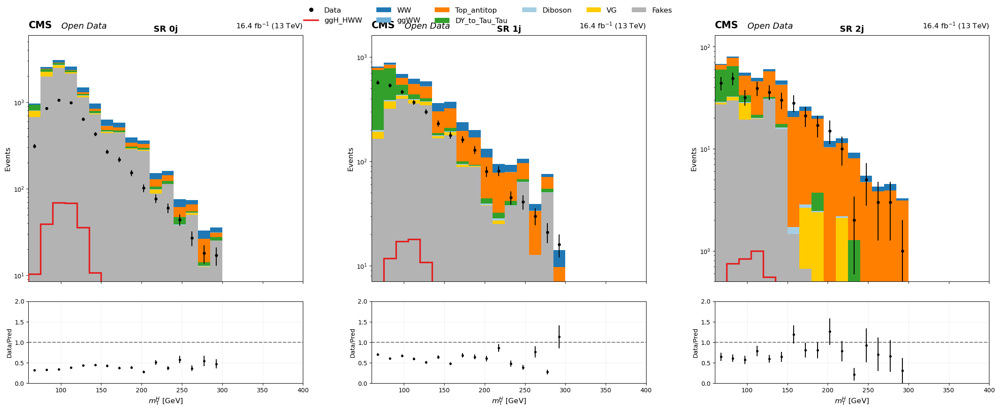

Plotting mt_higgs in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_higgs_Control_Region_Top.png


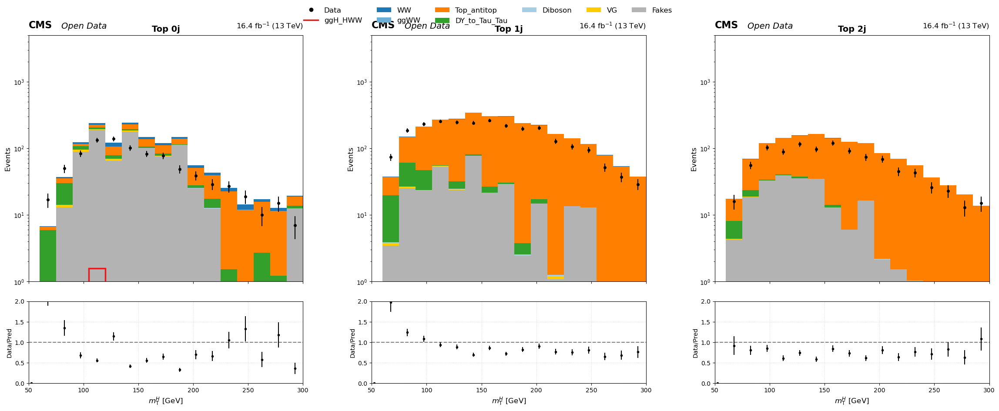

Plotting mt_higgs in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_higgs_Control_Region_Tau.png


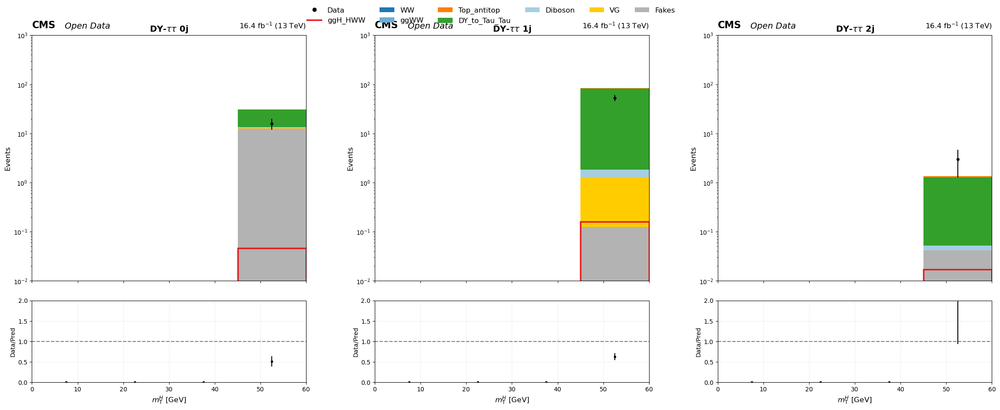

Plotting mt_l2_met in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_l2_met_Signal_Region.png


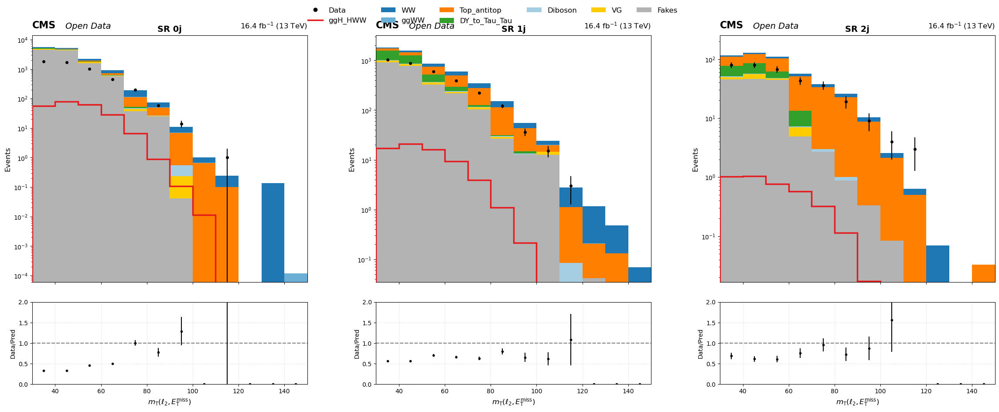

Plotting mt_l2_met in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_l2_met_Control_Region_Top.png


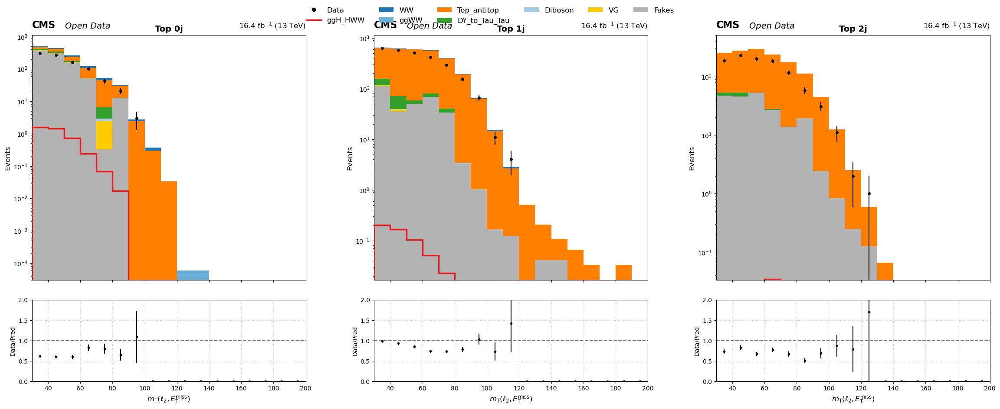

Plotting mt_l2_met in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mt_l2_met_Control_Region_Tau.png


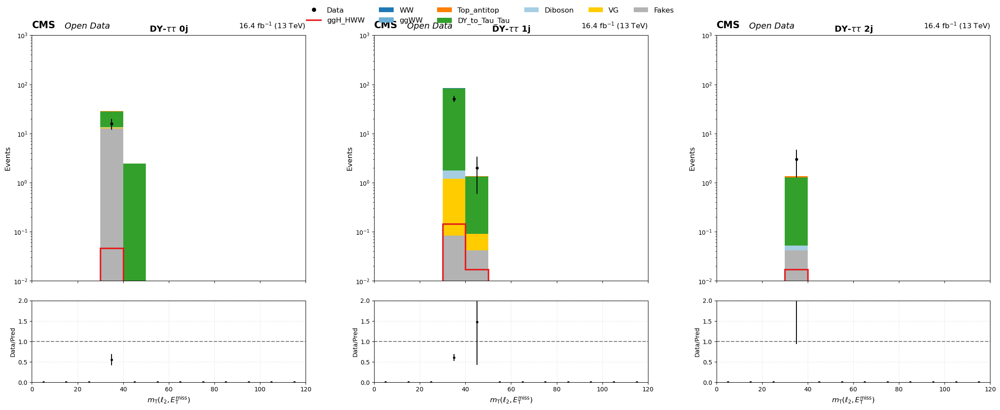

Plotting mjj in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mjj_Signal_Region.png


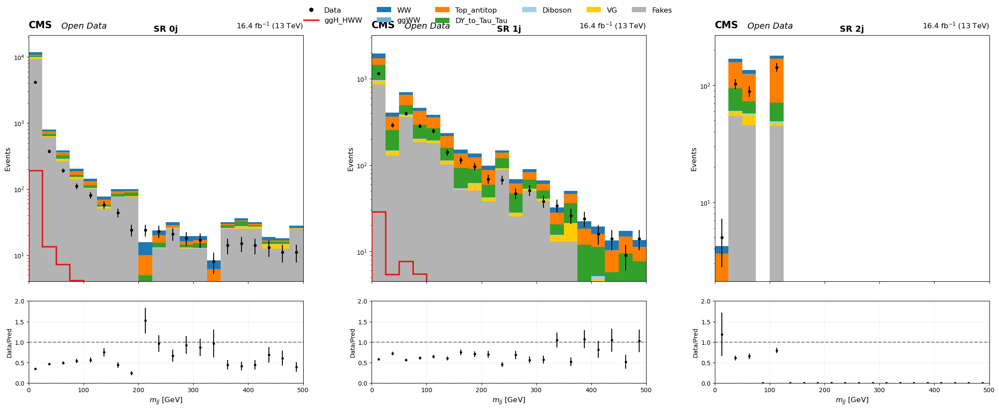

Plotting mjj in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mjj_Control_Region_Top.png


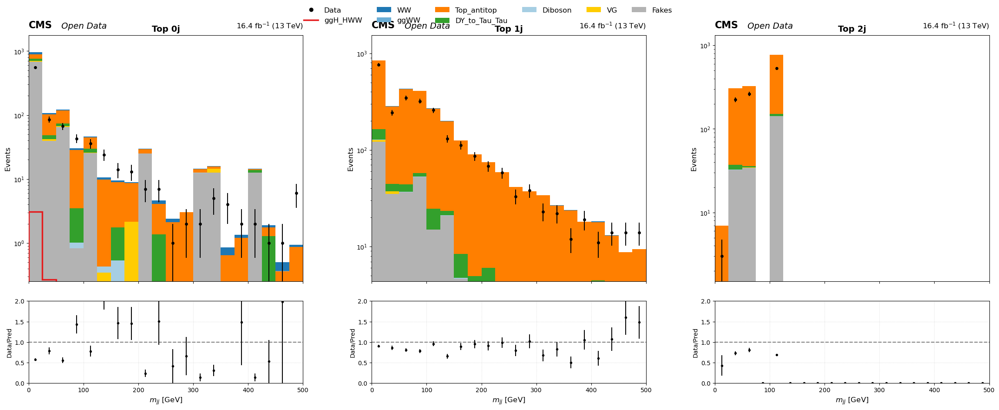

Plotting mjj in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/mjj_Control_Region_Tau.png


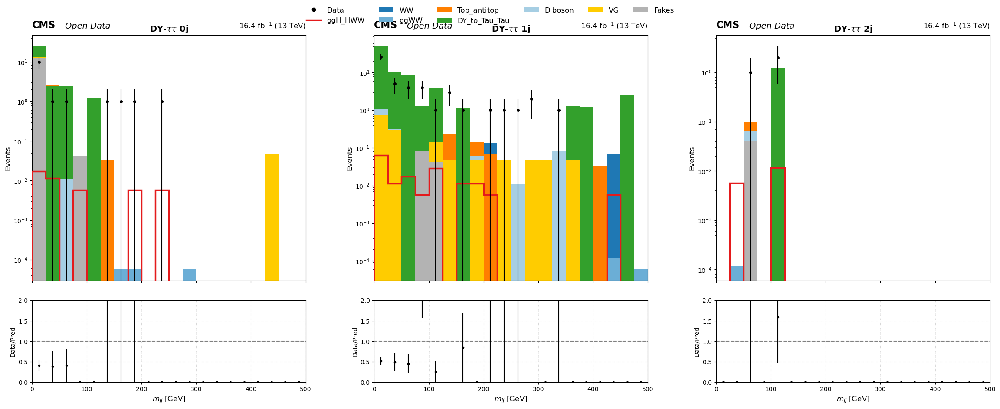

Plotting leading_pt in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/leading_pt_Signal_Region.png


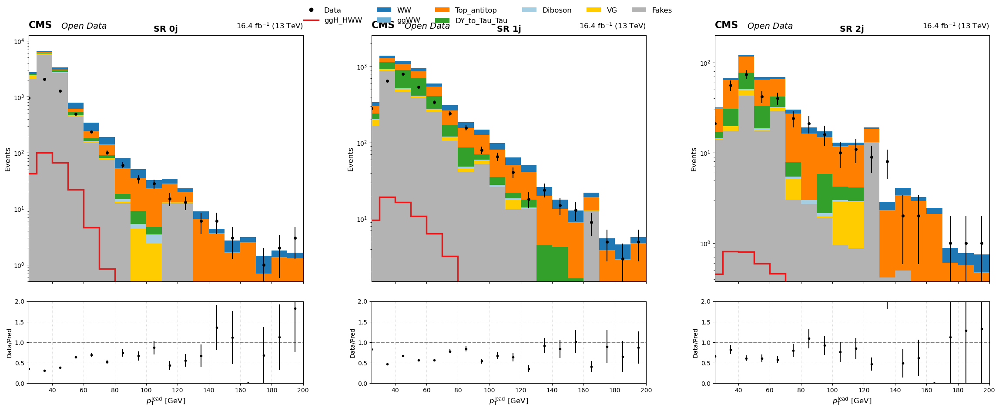

Plotting leading_pt in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/leading_pt_Control_Region_Top.png


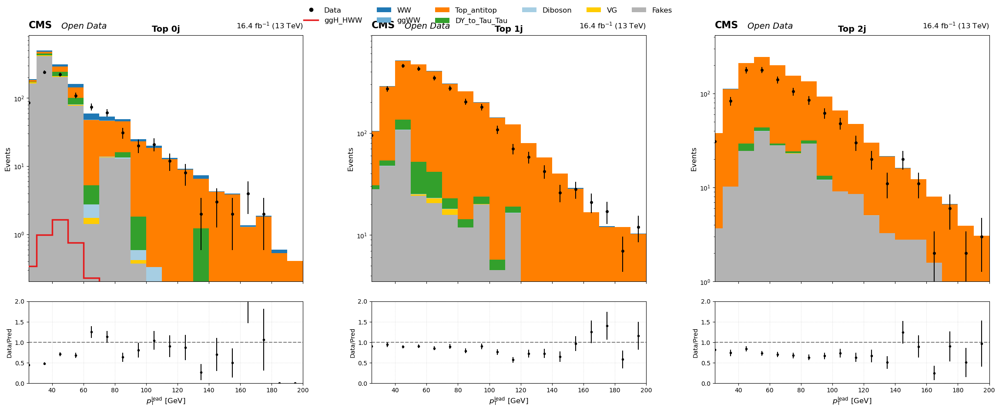

Plotting leading_pt in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/leading_pt_Control_Region_Tau.png


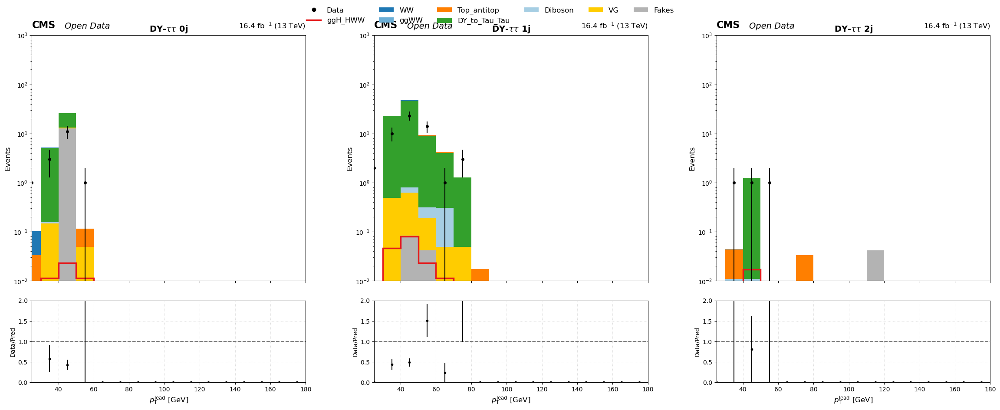

Plotting subleading_pt in Signal_Region...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/subleading_pt_Signal_Region.png


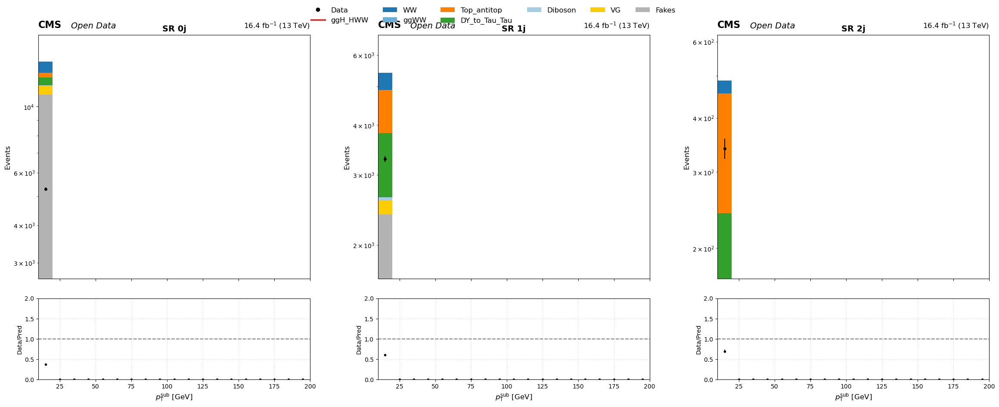

Plotting subleading_pt in Control_Region_Top...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/subleading_pt_Control_Region_Top.png


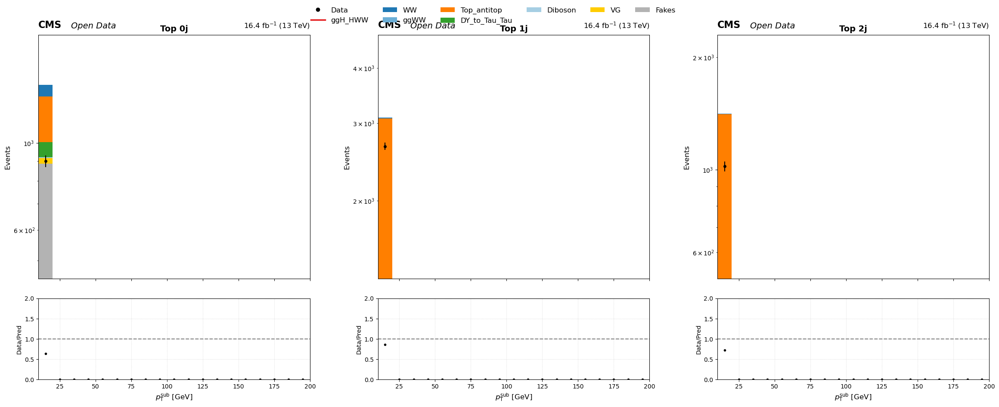

Plotting subleading_pt in Control_Region_Tau...
Saved: /home/cms-jovyan/H-to-WW-NanoAOD-analysis/Plots/stacked/subleading_pt_Control_Region_Tau.png


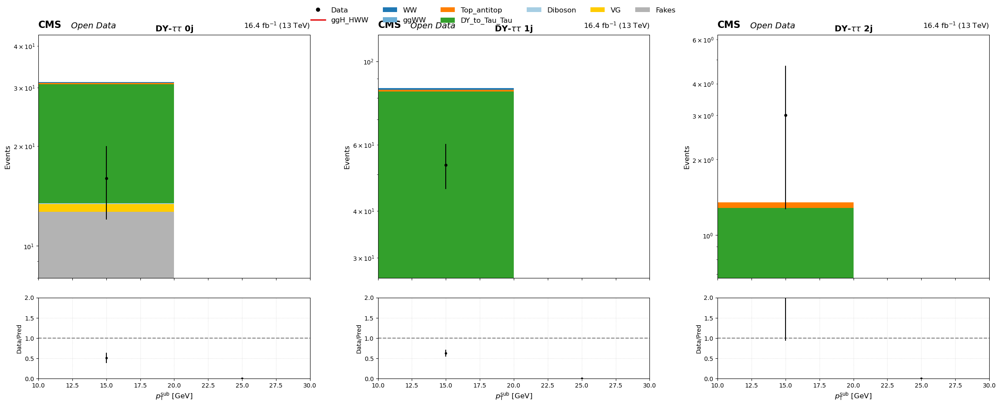

In [81]:
# %%
# ==============================================================================
# 1. MASTER PLOTTING CONFIGURATION
# ==============================================================================
# This dictionary gives you full granular control per Region AND per Variable.


# ==============================================================================
# 2. PLOTTING ENGINE
# ==============================================================================

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import os

def cms_label(ax, lumi_text="16.4 fb$^{-1}$ (13 TeV)"):
    ax.text(0.0, 1.02, "CMS", transform=ax.transAxes, fontsize=16, fontweight='bold', ha='left', va='bottom')
    ax.text(0.12, 1.02, "Open Data", transform=ax.transAxes, fontsize=14, ha='left', va='bottom', style='italic')
    ax.text(1.0, 1.02, lumi_text, transform=ax.transAxes, fontsize=12, ha='right', va='bottom')

def stacked_plots(variable, hist_data_all, output_dir="plots"):
    
    os.makedirs(output_dir, exist_ok=True)
    xlabel = VAR_LABELS.get(variable, variable)
    
    # 1. PREPARE SAMPLES
    # Assuming global 'SAMPLES' dict exists from previous cells
    backgrounds = [s for s in SAMPLES if not SAMPLES[s]['is_signal'] and s != 'Data']
    backgrounds.sort(key=lambda s: SAMPLES[s].get("stack_order", 0))
    signal = next((s for s in SAMPLES if SAMPLES[s]['is_signal']), None)
    data_sample = 'Data'

    # 2. ITERATE OVER REGIONS (SR, Top CR, Tau CR)
    for region_name, config in PLOT_SETTINGS.items():
        
        # Check if this variable is defined for this region
        # If not defined in 'variables', we define default behavior or skip
        var_config = config['variables'].get(variable)
        if not var_config:
            # Option A: Skip if not explicitly configured
            # continue 
            # Option B: Use defaults
            var_config = {"log": False, "xlim": None, "ylim": None}

        print(f"Plotting {variable} in {region_name}...")

        # Plot Settings extracted from Config
        do_plot_data = config['plot_data']
        use_log = var_config.get('log', False)
        set_xlim = var_config.get('xlim', None)
        set_ylim = var_config.get('ylim', None)
        stages = config['stages']

        # Cache Data for this specific variable & region
        hist_cache = {}
        samples_to_load = backgrounds + ([signal] if signal else []) + [data_sample]
        stage_keys = [s[0] for s in stages]

        for sample in samples_to_load:
            hist_cache[sample] = {}
            for st in stage_keys:
                try:
                    h = hist_data_all[sample][st][variable]
                    if hasattr(h, 'to_numpy'):
                        hist_cache[sample][st] = h.to_numpy()
                except (KeyError, AttributeError): pass

        # --- CANVAS SETUP ---
        fig = plt.figure(figsize=(24, 10), dpi=100) # Taller canvas
        plt.subplots_adjust(left=0.06, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.12)
        gs = fig.add_gridspec(2, 3, height_ratios=[3, 1])

        plotted_something = False
        handles, labels = [], []
        added_labels = set()

        # --- LOOP OVER STAGES (0j, 1j, 2j) ---
        for col_idx, (stage_key, stage_label) in enumerate(stages):
            
            ax_main = fig.add_subplot(gs[0, col_idx])
            ax_ratio = fig.add_subplot(gs[1, col_idx], sharex=ax_main)
            plt.setp(ax_main.get_xticklabels(), visible=False)

            # Get edges
            edges = None
            for s in hist_cache:
                if stage_key in hist_cache[s]:
                    _, edges = hist_cache[s][stage_key]
                    break
            
            if edges is None:
                ax_main.text(0.5, 0.5, 'No Data', ha='center', transform=ax_main.transAxes)
                continue
            
            plotted_something = True

            # -- DATA --
            bg_counts, bg_colors = [], []
            for s in backgrounds:
                if s in hist_cache and stage_key in hist_cache[s]:
                    v, _ = hist_cache[s][stage_key]
                    bg_counts.append(v)
                    bg_colors.append(SAMPLES[s]["color"])
                    if s not in added_labels:
                        handles.append(mpatches.Patch(facecolor=SAMPLES[s]["color"], label=s))
                        labels.append(s); added_labels.add(s)

            total_bg = np.sum(bg_counts, axis=0) if bg_counts else np.zeros(len(edges)-1)

            # -- PLOT STACK --
            if bg_counts:
                ax_main.hist([edges[:-1] for _ in bg_counts], bins=edges, weights=bg_counts,
                             stacked=True, color=bg_colors, histtype='stepfilled')

            # -- PLOT SIGNAL --
            if signal and signal in hist_cache and stage_key in hist_cache[signal]:
                s_v, _ = hist_cache[signal][stage_key]
                ax_main.hist(edges[:-1], bins=edges, weights=s_v, histtype='step',
                             color=SAMPLES[signal]["color"], linewidth=2.5, zorder=10)
                if signal not in added_labels:
                    handles.append(plt.Line2D([0],[0], color=SAMPLES[signal]["color"], linewidth=2.5, label=signal))
                    labels.append(signal); added_labels.add(signal)

            # -- PLOT DATA --
            dat_v = None
            if do_plot_data and data_sample in hist_cache and stage_key in hist_cache[data_sample]:
                dat_v, _ = hist_cache[data_sample][stage_key]
                centers = 0.5*(edges[:-1]+edges[1:])
                ax_main.errorbar(centers, dat_v, yerr=np.sqrt(np.maximum(dat_v, 0)),
                                 fmt='o', color='black', markersize=4, zorder=11)
                if data_sample not in added_labels:
                    handles.append(plt.Line2D([0],[0], marker='o', color='black', linestyle='none', label=data_sample))
                    labels.append(data_sample); added_labels.add(data_sample)

            # -- RATIO --
            ax_ratio.axhline(1.0, color='gray', linestyle='--')
            if dat_v is not None and np.sum(total_bg) > 0:
                valid = total_bg > 0
                ratio = np.zeros_like(total_bg)
                ratio[valid] = dat_v[valid] / total_bg[valid]
                err = np.zeros_like(total_bg)
                err[valid] = np.sqrt(dat_v[valid]) / total_bg[valid]
                ax_ratio.errorbar(0.5*(edges[:-1]+edges[1:]), ratio, yerr=err, fmt='o', color='black', markersize=3)

            # -- STYLING (THE CONTROL YOU REQUESTED) --
            cms_label(ax_main)
            ax_main.set_title(stage_label, fontsize=14, fontweight='bold')
            ax_main.set_ylabel('Events', fontsize=12)
            
            # 1. Log Scale Control
            if use_log: 
                ax_main.set_yscale('log')
                # Smart log minimum
                all_v = np.concatenate([total_bg, dat_v if dat_v is not None else []])
                min_v = np.min(all_v[all_v > 0]) if len(all_v[all_v > 0]) > 0 else 0.1
                ax_main.set_ylim(bottom=min_v * 0.5)
            else:
                ax_main.set_ylim(bottom=0)

            # 2. Y-Limit Control
            if set_ylim: ax_main.set_ylim(set_ylim)
            elif not use_log: 
                # Auto-scale linear
                top_v = np.max(total_bg)
                if dat_v is not None: top_v = max(top_v, np.max(dat_v))
                ax_main.set_ylim(0, top_v * 1.4)

            # 3. X-Limit Control
            if set_xlim: ax_main.set_xlim(set_xlim)
            else: ax_main.set_xlim(edges[0], edges[-1])

            # Ratio Styling
            ax_ratio.set_ylim(0.0, 2.0)
            ax_ratio.set_ylabel("Data/Pred", fontsize=10)
            ax_ratio.set_xlabel(xlabel, fontsize=12)
            ax_ratio.grid(True, linestyle=':', alpha=0.5)

        # -- LEGEND & SAVE --
        if plotted_something:
            # Reorder legend: Data -> Signal -> Backgrounds (reversed)
            final_h, final_l = [], []
            if data_sample in labels:
                i = labels.index(data_sample)
                final_h.append(handles[i]); final_l.append(labels[i])
            if signal in labels:
                i = labels.index(signal)
                final_h.append(handles[i]); final_l.append(labels[i])
            for b in reversed(backgrounds):
                if b in labels:
                    i = labels.index(b)
                    final_h.append(handles[i]); final_l.append(labels[i])

            fig.legend(final_h, final_l, loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=6, frameon=False, fontsize=12)
            
            fname = f"{output_dir}/{variable}_{region_name}.png"
            plt.savefig(fname, bbox_inches='tight')
            print(f"Saved: {fname}")
            plt.show()
        plt.close(fig)

# ==============================================================================
# 3. RUN IT
# ==============================================================================

# Loop through all variables defined in VAR_LABELS
for var in VAR_LABELS:
    stacked_plots(var, hist_data_final, OUTPUT_DIR)

## old stacked plts

In [85]:
# def cms_label(ax, lumi_text="16.1 fb$^{-1}$ (13 TeV)"):
#     # Top Left - CMS Open Data
#     ax.text(0.0, 1.02, "CMS OpenData", 
#             transform=ax.transAxes, 
#             fontsize=14, 
#             fontweight='bold', 
#             ha='left', 
#             va='bottom')
    
#     # Top Right - Luminosity
#     ax.text(1.0, 1.02, lumi_text, 
#             transform=ax.transAxes, 
#             fontsize=12, 
#             ha='right', 
#             va='bottom')

# def stacked_plots(variable, var_props, hist_data_all, output_dir="plots"):
    
#     PLOT_DATA = True 
#     os.makedirs(output_dir, exist_ok=True)
    
#     use_log_scale = True  
#     y_padding = 100 if use_log_scale else 1.4
#     xlabel = var_props.get('xlabel', variable)
#     xlim = var_props.get('xlim', None)
    
    
#     plot_groups = {
#         "Signal_Region": [
#             ('SR_0jet', 'SR 0-jet'), 
#             ('SR_1jet', 'SR 1-jet'), 
#             ('SR_2jet', 'SR 2-jet')
#         ],
#         "Control_Region_Top": [
#             ('CR_top_0jet', 'Top CR 0-jet'), 
#             ('CR_top_1jet', 'Top CR 1-jet'), 
#             ('CR_top_2jet', 'Top CR 2-jet')
#         ],
#         "Control_Region_Tau": [
#             ('CR_tau_0jet', r'$\tau\tau$ CR 0-jet'), 
#             ('CR_tau_1jet', r'$\tau\tau$ CR 1-jet'), 
#             ('CR_tau_2jet', r'$\tau\tau$ CR 2-jet')
#         ]
#     }

#     backgrounds, signal = get_backgrounds_and_signal()
#     data_sample = get_data_sample()
#     backgrounds.sort(key=lambda s: SAMPLES[s].get("stack_order", 0))

#     samples_to_cache = backgrounds + [signal, data_sample]
#     hist_cache = {}
    
#     all_regions = []
#     for group in plot_groups.values():
#         all_regions.extend(group)
        
#     for sample in samples_to_cache:
#         if sample is None: continue
#         hist_cache[sample] = {}
#         for stage, _ in all_regions:
#             values, edges = get_histogram_data(hist_data_all, sample, stage, variable)
#             if values is not None and edges is not None:  
#                 hist_cache[sample][stage] = (values, edges)

#     for group_name, region_list in plot_groups.items():
        
#         print(f"Processing Group: {group_name}...")
        
#         fig = plt.figure(figsize=(24, 8), dpi=100)
        
#         plt.subplots_adjust(left=0.05, right=0.98, top=0.85, bottom=0.12)
        
#         gs = fig.add_gridspec(2, 3, height_ratios=[3, 1], hspace=0.1, wspace=0.25)
        
#         plotted_anything = False
        
#         group_handles = {}
#         bg_labels_ordered = [] 

#         for col_idx, (stage, stage_label) in enumerate(region_list):
            
#             ax_main = fig.add_subplot(gs[0, col_idx])
#             ax_ratio = fig.add_subplot(gs[1, col_idx], sharex=ax_main)
#             plt.setp(ax_main.get_xticklabels(), visible=False)

#             edges = None
#             for sample in hist_cache:
#                 if stage in hist_cache[sample]:
#                     _, edges = hist_cache[sample][stage]
#                     break

#             if edges is None:
#                 ax_main.text(0.5, 0.5, 'No data', ha='center', transform=ax_main.transAxes)
#                 continue
                
#             plotted_anything = True

#             # 1. PREPARE STACK
#             bg_values = []
#             bg_colors = []
            
#             for sample in backgrounds:
#                 if sample in hist_cache and stage in hist_cache[sample]:   
#                     values, _ = hist_cache[sample][stage]
#                     bg_values.append(values)
#                     bg_colors.append(SAMPLES[sample]["color"])
#                     if sample not in group_handles: 
#                         group_handles[sample] = mpatches.Patch(facecolor=SAMPLES[sample]["color"], label=sample)
#                         bg_labels_ordered.append(sample) 

#             # Signal (Stacked)
#             signal_values = None
#             if signal and signal in hist_cache and stage in hist_cache[signal]:  
#                 signal_values, _ = hist_cache[signal][stage]
#                 bg_values.append(signal_values)
#                 bg_colors.append(SAMPLES[signal]["color"])
#                 if signal not in group_handles:
#                       group_handles[signal] = plt.Line2D([0],[0], color=SAMPLES[signal]["color"], linewidth=2.5, label=signal)
#                       bg_labels_ordered.append(signal)

#             #  PLOT MAIN
#             if bg_values:  
#                 ax_main.hist([edges[:-1] for _ in bg_values], bins=edges, weights=bg_values,
#                              stacked=True, color=bg_colors, histtype='stepfilled', alpha=1.0, edgecolor='none')

#             # Signal Overlay
#             if signal_values is not None:
#                 ax_main.hist(edges[:-1], bins=edges, weights=signal_values, histtype='step',
#                              color=SAMPLES[signal]["color"], linewidth=2.5, zorder=10)

#             # Data
#             data_values = None
#             if PLOT_DATA and data_sample in hist_cache and stage in hist_cache[data_sample]:
#                 data_values, _ = hist_cache[data_sample][stage]
#                 centers = 0.5 * (edges[:-1] + edges[1:])
#                 ax_main.errorbar(centers, data_values, yerr=np.sqrt(np.maximum(data_values, 0)), 
#                                  fmt='o', color='black', markersize=4, zorder=11, label=data_sample)
#                 if data_sample not in group_handles:
#                     group_handles[data_sample] = plt.Line2D([0],[0], marker='o', color='black', linestyle='none', label=data_sample)

#             #  PLOT RATIO
#             total_mc = np.sum(bg_values, axis=0) if bg_values else np.zeros(len(edges)-1)
#             ax_ratio.axhline(1.0, color='gray', linestyle='--', linewidth=1)

#             if data_values is not None and np.sum(total_mc) > 0:
#                 valid_bins = total_mc > 0
#                 ratio = np.zeros_like(total_mc)
#                 ratio[valid_bins] = data_values[valid_bins] / total_mc[valid_bins]
#                 ratio_err = np.zeros_like(total_mc)
#                 ratio_err[valid_bins] = np.sqrt(data_values[valid_bins]) / total_mc[valid_bins]
                
#                 centers = 0.5 * (edges[:-1] + edges[1:])
#                 ax_ratio.errorbar(centers, ratio, yerr=ratio_err, fmt='o', color='black', markersize=3)

#             # STYLING
#             cms_label(ax_main)
            
#             # Limits
#             ax_ratio.set_ylim(0.0, 2.0)
#             ax_ratio.set_ylabel("Data / Pred", fontsize=10)
#             ax_ratio.set_xlabel(xlabel, fontsize=12)
#             ax_ratio.grid(True, linestyle=':', alpha=0.5)

#             y_max = np.max(total_mc) if len(total_mc) > 0 else 0
#             if data_values is not None: y_max = max(y_max, np.max(data_values))
            
#             if use_log_scale:
#                 ax_main.set_yscale('log')
#                 # ax_main.set_ylim(0.1, 1000)
#             else:
#                 ax_main.set_ylim(0, y_max * 1.4)
                
#             if xlim: ax_main.set_xlim(xlim)
#             else: ax_main.set_xlim(edges[0], edges[-1])

#             ax_main.set_title(stage_label, fontsize=14, fontweight='bold')
#             ax_main.set_ylabel('Events', fontsize=12)

#         if plotted_anything:
#             final_handles = []
#             final_labels = []
            
#             # Data first
#             if data_sample in group_handles:
#                 final_handles.append(group_handles[data_sample])
#                 final_labels.append(data_sample)
            
#             # Signal second
#             if signal in group_handles:
#                 final_handles.append(group_handles[signal])
#                 final_labels.append(signal)

#             # Backgrounds 
#             for sample in reversed(backgrounds):
#                 if sample in group_handles and sample in bg_labels_ordered:
#                     final_handles.append(group_handles[sample])
#                     final_labels.append(sample)

#             fig.legend(final_handles, final_labels, 
#                        loc='upper center', 
#                        bbox_to_anchor=(0.5, 0.98), 
#                        ncol=6, 
#                        fontsize=12, 
#                        frameon=False)

#             filename_base = f"{output_dir}/{variable}_{group_name}"
#             plt.savefig(f"{filename_base}.png", bbox_inches='tight')
#             print(f"Saved: {filename_base}.png")
#             plt.show()
        
#         plt.close(fig)

#     return "Grouped plots complete."

In [87]:
    
    # VARIABLE_CONFIG = {
    #     'mass': {
    #         'xlabel': r'$m_{e\mu}$ [GeV]',
    #         # 'xlim':  (25, 200),
    #         'title': 'Invariant Mass Distribution',
    #     },
    #     'met': {
    #         'xlabel': r'$E_{\mathrm{T}}^{\mathrm{miss}}$ [GeV]',
    #         # 'xlim': (25, 150),
    #         'title': 'Missing Transverse Energy Distribution',
    #     },
    #     'ptll': {
    #         'xlabel': r'$p_{\mathrm{T}}^{\ell\ell}$ [GeV]',
    #         # 'xlim': (30, 200),
    #         'title': 'Dilepton Transverse Momentum Distribution',
    #     },
    #     'dphi':  {
    #         'xlabel': r'$\Delta\phi(e,\mu)$ [rad]',
    #         # 'xlim': (0, 3.14),
    #         'title': 'Azimuthal Angle Difference Distribution',
    #     },
    #     'mt_higgs': {
    #         'xlabel': r'$m_{\mathrm{T}}^{H}$ [GeV]',
    #         # 'xlim': (0, 300),
    #         'title': 'Higgs Transverse Mass Distribution',
    #     },
    #     'mt_l2_met':  {
    #         'xlabel': r'$m_{\mathrm{T}}(\ell_2, E_{\mathrm{T}}^{\mathrm{miss}})$ [GeV]',
    #         # 'xlim': (30, 130),
    #         'title': 'Subleading Lepton-MET Transverse Mass Distribution',
    #     },
    #     'mjj': {
    #         'xlabel': r'$m_{jj}$ [GeV]',
    #         # 'xlim': (0, 500),
    #         'title': 'Dijet Invariant Mass Distribution',
    #     },
    #     'leading_pt': {
    #         'xlabel': r'$p_{\mathrm{T}}^{\mathrm{leading}}$ [GeV]',
    #         # 'xlim': (20, 200),
    #         'title': 'Leading Lepton Transverse Momentum Distribution',
    #     },
    #     'subleading_pt':  {
    #         'xlabel': r'$p_{\mathrm{T}}^{\mathrm{subleading}}$ [GeV]',
    #         # 'xlim':  (10, 20),
    #         'title': 'Subleading Lepton Transverse Momentum Distribution',
    #     },
    # }
    
    # DEFAULT_PROPS = {
    #     'use_log_scale': False,
    #     'plot_data_in_SR': False
    # }
    
    
    
    # def plot_distribution(variable, hist_data_all, config=VARIABLE_CONFIG, defaults=DEFAULT_PROPS, output_dir="plots"):
    #     if variable not in config:
    #         raise ValueError(f"Unknown variable '{variable}'. Available: {list(config.keys())}")
        
    #     var_props = {**defaults, **config[variable]}
        
    #     stacked_plots(variable, var_props, hist_data_all, output_dir=output_dir)
    
    
    # def plot_all_distributions(hist_data_all, variables=None, config=VARIABLE_CONFIG, output_dir="plots"):
        
    #     if variables is None: 
    #         variables = list(config.keys())
        
    #     print("\n" + "=" * 80)
    #     print("GENERATING DISTRIBUTION PLOTS ")
    #     print("=" * 80)
    #     print(f"Variables: {', '.join(variables)}")
    #     print(f"Output Directory: {output_dir}")
    #     print("-" * 80)
        
    #     successful = 0
    #     failed = 0
        
    #     for var_name in variables:
    #         print(f"\n---> Processing {var_name}...")
            
    #         try:
    #             plot_distribution(var_name, hist_data_all, config, output_dir=output_dir)
    #             successful += 1
                
    #         except Exception as e:
    #             print(f"     [ERROR] Failed to plot {var_name}: {e}")
    #             import traceback
    #             traceback.print_exc()
    #             failed += 1
        
    #     print("\n" + "=" * 80)
    #     print(f"COMPLETE: {successful} variables processed successfully, {failed} failed")
    #     print("=" * 80 + "\n")
    
    
    
    # """
    #     EXECUTION
    #     Run the plotting loop
    # """
    # plot_all_distributions(hist_data_final, output_dir=OUTPUT_DIR)